# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 36kB/s  eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

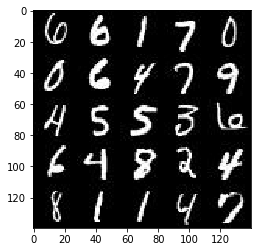

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

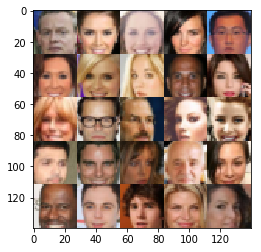

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
     #TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width , image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return inputs_real, inputs_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)



ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 888, in start\n    handler_func(fd_obj, events)', 'File "/opt/conda/lib/

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha=0.2
        # Input layer 28x28xnum_channels 
        x11 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer(), 
                                  bias_initializer=tf.constant_initializer(0.0))
        relu1 = tf.maximum(alpha * x11, x11)
        
        
        x1b = tf.layers.conv2d(relu1, 64, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), 
                                  bias_initializer=tf.constant_initializer(0.0))
        bn1b = tf.layers.batch_normalization(x1b, training=True)
        relu1b = tf.maximum(alpha * bn1b, bn1b)
        # 14x14x64
        
        x22 = tf.layers.conv2d(relu1b, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), 
                                  bias_initializer=tf.constant_initializer(0.0))
        bn2 = tf.layers.batch_normalization(x22, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x33 = tf.layers.conv2d(relu2, 512, 3, strides = 2, padding = 'same', 
                                  kernel_initializer=tf.contrib.layers.xavier_initializer(),
                                  bias_initializer=tf.constant_initializer(0.0))
        bn3 = tf.layers.batch_normalization(x33, training = True)
        relu3 = tf.maximum(bn3, bn3 * alpha)
        #4x4x512

        # Flatten it
        flat = tf.reshape(relu2, (-1, 4*4*512))
        logits = tf.layers.dropout(tf.layers.dense(flat, 1))
        out = tf.sigmoid(logits)

    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [14]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.02
    with tf.variable_scope('generator', reuse= not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z,7*7*512)
        x1_reshape = tf.reshape(x1, (-1, 7, 7, 512))
        x1_batch_normal = tf.layers.batch_normalization( x1_reshape, training=is_train)
        x1_relu = tf.maximum(alpha * x1_batch_normal, x1_batch_normal)
        # 7x7x512
        
        x2 = tf.layers.conv2d_transpose(x1_relu, 512, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), 
                                  bias_initializer=tf.constant_initializer(0.0)) 
        x2_batch_normal = tf.layers.batch_normalization(x2, training=is_train)
        x2_relu = tf.maximum(alpha * x2_batch_normal, x2_batch_normal)
        #7x7x512
        
        x3 = tf.layers.conv2d_transpose(x2_relu, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), 
                                  bias_initializer=tf.constant_initializer(0.0))
        x3_batch_normal = tf.layers.batch_normalization(x3, training=is_train)
        x3_relu = tf.maximum(alpha *x3_batch_normal, x3_batch_normal)
        #14x14x256 now
        
        #additional layer to get better generator performance
        # keep dimensions, with strides=1 and padding = 'same' 
        x4 = tf.layers.conv2d_transpose(x3_relu, 256, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), 
                                  bias_initializer=tf.constant_initializer(0.0))
        x4_batch_normal = tf.layers.batch_normalization(x4, training=is_train)
        x4_relu = tf.maximum(alpha * x4_batch_normal, x4_batch_normal)
        #14x14x256 now
        
        logits = tf.layers.conv2d_transpose(x4_relu, out_channel_dim, 5, strides=2, padding='same')
        #28x28xout_channel_dim now
        out= tf.tanh(logits)
    return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [15]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real))*0.9)
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake))*0.9)

    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss
#The 0.9 multiplication: one-sided label smoothing. 
#It's done to prevent discriminator from being too strong as well as to help it generalise better by reducing labels from 1 to 0.9.

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [16]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [18]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    
    inputs_real, inputs_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                # TODO: Train Model
                steps += 1
                # Create random noise for the generator's input
                batch_z = np.random.uniform(-1, 1, size = (batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict = {inputs_real: batch_images, 
                                                            inputs_z: batch_z, 
                                                            lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict = {inputs_z: batch_z, 
                                                           inputs_real: batch_images, 
                                                           lr: learning_rate})
                
                _ = sess.run(g_train_opt, feed_dict = {inputs_z: batch_z, 
                                                           inputs_real: batch_images, 
                                                           lr: learning_rate})
                
                # Print losses
                if steps % 10 == 0:
                    # Evaluate losses and print them
                    train_loss_d = d_loss.eval({inputs_z: batch_z, 
                                                    inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs), 
                          "Discriminator Loss: {:.4f}...".format(train_loss_d), 
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    # Display generated images
                    if steps % 100 == 0:
                        show_generator_output(sess, 25, inputs_z, image_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 7.3088... Generator Loss: 0.0013
Epoch 1/2... Discriminator Loss: 4.3236... Generator Loss: 0.0285
Epoch 1/2... Discriminator Loss: 3.8452... Generator Loss: 0.0510
Epoch 1/2... Discriminator Loss: 3.5132... Generator Loss: 0.0629
Epoch 1/2... Discriminator Loss: 4.4437... Generator Loss: 0.0199
Epoch 1/2... Discriminator Loss: 3.7009... Generator Loss: 0.0498
Epoch 1/2... Discriminator Loss: 3.5144... Generator Loss: 0.1037
Epoch 1/2... Discriminator Loss: 3.4333... Generator Loss: 0.0495
Epoch 1/2... Discriminator Loss: 3.5428... Generator Loss: 0.1227
Epoch 1/2... Discriminator Loss: 3.6387... Generator Loss: 0.0418


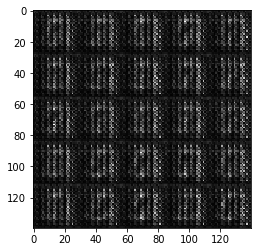

Epoch 1/2... Discriminator Loss: 3.6656... Generator Loss: 0.0887
Epoch 1/2... Discriminator Loss: 3.0130... Generator Loss: 0.1012
Epoch 1/2... Discriminator Loss: 3.0399... Generator Loss: 0.0957
Epoch 1/2... Discriminator Loss: 2.6818... Generator Loss: 0.1110
Epoch 1/2... Discriminator Loss: 3.5959... Generator Loss: 0.0743
Epoch 1/2... Discriminator Loss: 2.6638... Generator Loss: 0.1138
Epoch 1/2... Discriminator Loss: 2.8211... Generator Loss: 0.1194
Epoch 1/2... Discriminator Loss: 3.5521... Generator Loss: 0.0647
Epoch 1/2... Discriminator Loss: 2.8043... Generator Loss: 0.1322
Epoch 1/2... Discriminator Loss: 3.0113... Generator Loss: 0.1181


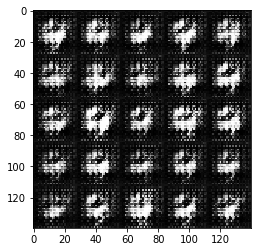

Epoch 1/2... Discriminator Loss: 3.0610... Generator Loss: 0.1155
Epoch 1/2... Discriminator Loss: 2.4504... Generator Loss: 0.1553
Epoch 1/2... Discriminator Loss: 2.7193... Generator Loss: 0.1405
Epoch 1/2... Discriminator Loss: 2.3766... Generator Loss: 0.1785
Epoch 1/2... Discriminator Loss: 3.0324... Generator Loss: 0.0921
Epoch 1/2... Discriminator Loss: 2.4714... Generator Loss: 0.1600
Epoch 1/2... Discriminator Loss: 2.4769... Generator Loss: 0.1498
Epoch 1/2... Discriminator Loss: 2.7186... Generator Loss: 0.1372
Epoch 1/2... Discriminator Loss: 2.1307... Generator Loss: 0.2248
Epoch 1/2... Discriminator Loss: 2.5513... Generator Loss: 0.1638


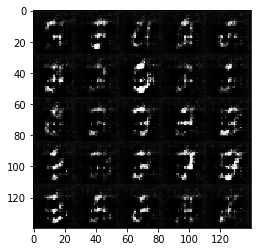

Epoch 1/2... Discriminator Loss: 2.5002... Generator Loss: 0.1735
Epoch 1/2... Discriminator Loss: 2.8080... Generator Loss: 0.1267
Epoch 1/2... Discriminator Loss: 2.5077... Generator Loss: 0.1549
Epoch 1/2... Discriminator Loss: 2.4076... Generator Loss: 0.1880
Epoch 1/2... Discriminator Loss: 2.2207... Generator Loss: 0.1885
Epoch 1/2... Discriminator Loss: 2.8243... Generator Loss: 0.1145
Epoch 1/2... Discriminator Loss: 2.3342... Generator Loss: 0.2129
Epoch 1/2... Discriminator Loss: 2.0703... Generator Loss: 0.2154
Epoch 1/2... Discriminator Loss: 2.4505... Generator Loss: 0.1975
Epoch 1/2... Discriminator Loss: 2.5502... Generator Loss: 0.1403


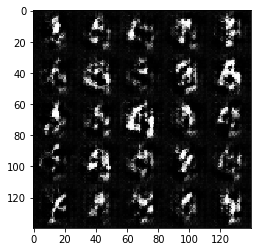

Epoch 1/2... Discriminator Loss: 2.1465... Generator Loss: 0.1915
Epoch 1/2... Discriminator Loss: 2.4211... Generator Loss: 0.1670
Epoch 1/2... Discriminator Loss: 2.2875... Generator Loss: 0.1806
Epoch 1/2... Discriminator Loss: 2.3434... Generator Loss: 0.1689
Epoch 1/2... Discriminator Loss: 2.2785... Generator Loss: 0.1726
Epoch 1/2... Discriminator Loss: 2.3131... Generator Loss: 0.1921
Epoch 1/2... Discriminator Loss: 2.4259... Generator Loss: 0.1749
Epoch 1/2... Discriminator Loss: 2.2300... Generator Loss: 0.1908
Epoch 1/2... Discriminator Loss: 2.1622... Generator Loss: 0.2100
Epoch 1/2... Discriminator Loss: 2.2891... Generator Loss: 0.1889


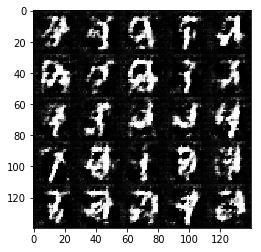

Epoch 1/2... Discriminator Loss: 2.2224... Generator Loss: 0.2109
Epoch 1/2... Discriminator Loss: 2.4983... Generator Loss: 0.1572
Epoch 1/2... Discriminator Loss: 2.4358... Generator Loss: 0.1928
Epoch 1/2... Discriminator Loss: 2.0760... Generator Loss: 0.2742
Epoch 1/2... Discriminator Loss: 2.2704... Generator Loss: 0.1833
Epoch 1/2... Discriminator Loss: 2.3566... Generator Loss: 0.1886
Epoch 1/2... Discriminator Loss: 2.2821... Generator Loss: 0.1861
Epoch 1/2... Discriminator Loss: 2.3199... Generator Loss: 0.1697
Epoch 1/2... Discriminator Loss: 2.0423... Generator Loss: 0.2375
Epoch 1/2... Discriminator Loss: 2.3272... Generator Loss: 0.2035


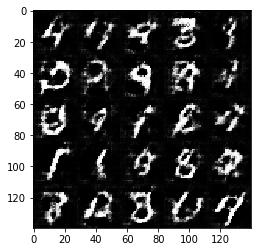

Epoch 1/2... Discriminator Loss: 1.8659... Generator Loss: 0.3011
Epoch 1/2... Discriminator Loss: 2.2322... Generator Loss: 0.2167
Epoch 1/2... Discriminator Loss: 2.1851... Generator Loss: 0.2454
Epoch 1/2... Discriminator Loss: 2.2136... Generator Loss: 0.1743
Epoch 1/2... Discriminator Loss: 2.3487... Generator Loss: 0.1916
Epoch 1/2... Discriminator Loss: 2.1926... Generator Loss: 0.1671
Epoch 1/2... Discriminator Loss: 2.3650... Generator Loss: 0.2244
Epoch 1/2... Discriminator Loss: 2.1064... Generator Loss: 0.2347
Epoch 1/2... Discriminator Loss: 2.1209... Generator Loss: 0.2068
Epoch 1/2... Discriminator Loss: 2.2116... Generator Loss: 0.2099


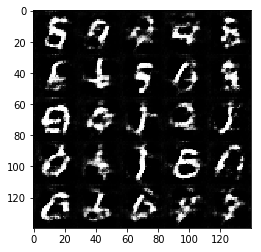

Epoch 1/2... Discriminator Loss: 1.8808... Generator Loss: 0.2503
Epoch 1/2... Discriminator Loss: 2.3823... Generator Loss: 0.1519
Epoch 1/2... Discriminator Loss: 2.1070... Generator Loss: 0.2409
Epoch 1/2... Discriminator Loss: 2.2667... Generator Loss: 0.1533
Epoch 1/2... Discriminator Loss: 1.9879... Generator Loss: 0.2389
Epoch 1/2... Discriminator Loss: 2.5159... Generator Loss: 0.1492
Epoch 1/2... Discriminator Loss: 2.1058... Generator Loss: 0.2853
Epoch 1/2... Discriminator Loss: 1.9256... Generator Loss: 0.2826
Epoch 1/2... Discriminator Loss: 1.7865... Generator Loss: 0.3472
Epoch 1/2... Discriminator Loss: 2.1737... Generator Loss: 0.2501


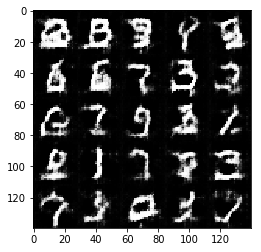

Epoch 1/2... Discriminator Loss: 2.1711... Generator Loss: 0.2122
Epoch 1/2... Discriminator Loss: 1.7479... Generator Loss: 0.3700
Epoch 1/2... Discriminator Loss: 1.9404... Generator Loss: 0.2927
Epoch 1/2... Discriminator Loss: 2.2492... Generator Loss: 0.2263
Epoch 1/2... Discriminator Loss: 2.0845... Generator Loss: 0.2773
Epoch 1/2... Discriminator Loss: 2.0376... Generator Loss: 0.2655
Epoch 1/2... Discriminator Loss: 1.7625... Generator Loss: 0.3428
Epoch 1/2... Discriminator Loss: 1.9824... Generator Loss: 0.2460
Epoch 1/2... Discriminator Loss: 2.0387... Generator Loss: 0.2769
Epoch 1/2... Discriminator Loss: 1.8064... Generator Loss: 0.3228


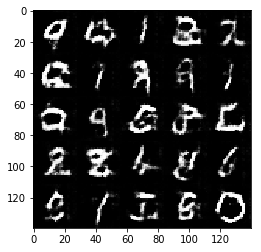

Epoch 1/2... Discriminator Loss: 2.1287... Generator Loss: 0.2266
Epoch 1/2... Discriminator Loss: 1.8747... Generator Loss: 0.2920
Epoch 1/2... Discriminator Loss: 1.8486... Generator Loss: 0.2655
Epoch 1/2... Discriminator Loss: 1.9817... Generator Loss: 0.3061
Epoch 1/2... Discriminator Loss: 2.0334... Generator Loss: 0.2960
Epoch 1/2... Discriminator Loss: 1.9778... Generator Loss: 0.2543
Epoch 1/2... Discriminator Loss: 2.0130... Generator Loss: 0.3312
Epoch 1/2... Discriminator Loss: 1.8940... Generator Loss: 0.3127
Epoch 1/2... Discriminator Loss: 2.1458... Generator Loss: 0.2190
Epoch 1/2... Discriminator Loss: 1.8689... Generator Loss: 0.2815


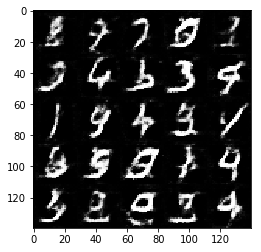

Epoch 1/2... Discriminator Loss: 2.1370... Generator Loss: 0.2472
Epoch 1/2... Discriminator Loss: 1.9641... Generator Loss: 0.2723
Epoch 1/2... Discriminator Loss: 1.9647... Generator Loss: 0.2423
Epoch 1/2... Discriminator Loss: 1.8913... Generator Loss: 0.2673
Epoch 1/2... Discriminator Loss: 1.9668... Generator Loss: 0.2778
Epoch 1/2... Discriminator Loss: 1.8068... Generator Loss: 0.3527
Epoch 1/2... Discriminator Loss: 1.9129... Generator Loss: 0.2910
Epoch 1/2... Discriminator Loss: 1.8083... Generator Loss: 0.3504
Epoch 1/2... Discriminator Loss: 2.0727... Generator Loss: 0.2308
Epoch 1/2... Discriminator Loss: 2.0372... Generator Loss: 0.2089


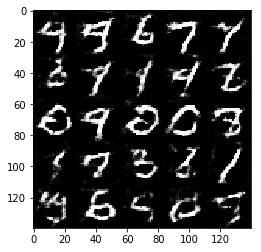

Epoch 1/2... Discriminator Loss: 1.8664... Generator Loss: 0.2641
Epoch 1/2... Discriminator Loss: 2.0015... Generator Loss: 0.3154
Epoch 1/2... Discriminator Loss: 2.1026... Generator Loss: 0.2542
Epoch 1/2... Discriminator Loss: 2.0452... Generator Loss: 0.2403
Epoch 1/2... Discriminator Loss: 1.8407... Generator Loss: 0.3221
Epoch 1/2... Discriminator Loss: 1.9576... Generator Loss: 0.2388
Epoch 1/2... Discriminator Loss: 1.7432... Generator Loss: 0.3320
Epoch 1/2... Discriminator Loss: 1.7487... Generator Loss: 0.3379
Epoch 1/2... Discriminator Loss: 1.9344... Generator Loss: 0.2882
Epoch 1/2... Discriminator Loss: 1.8239... Generator Loss: 0.2798


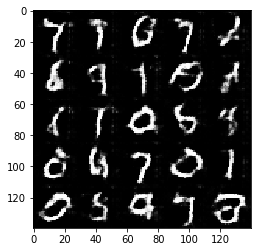

Epoch 1/2... Discriminator Loss: 1.9773... Generator Loss: 0.2995
Epoch 1/2... Discriminator Loss: 1.7840... Generator Loss: 0.3145
Epoch 1/2... Discriminator Loss: 1.9411... Generator Loss: 0.2721
Epoch 1/2... Discriminator Loss: 1.7109... Generator Loss: 0.3656
Epoch 1/2... Discriminator Loss: 1.7329... Generator Loss: 0.3446
Epoch 1/2... Discriminator Loss: 1.8171... Generator Loss: 0.2827
Epoch 1/2... Discriminator Loss: 2.0832... Generator Loss: 0.2471
Epoch 1/2... Discriminator Loss: 1.7812... Generator Loss: 0.3353
Epoch 1/2... Discriminator Loss: 1.7483... Generator Loss: 0.3417
Epoch 1/2... Discriminator Loss: 1.7504... Generator Loss: 0.3309


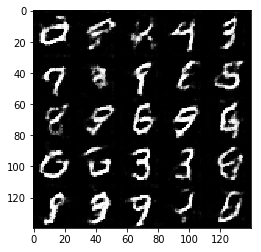

Epoch 1/2... Discriminator Loss: 2.0271... Generator Loss: 0.2644
Epoch 1/2... Discriminator Loss: 1.7955... Generator Loss: 0.3280
Epoch 1/2... Discriminator Loss: 1.8744... Generator Loss: 0.2586
Epoch 1/2... Discriminator Loss: 1.9333... Generator Loss: 0.3089
Epoch 1/2... Discriminator Loss: 1.8899... Generator Loss: 0.2463
Epoch 1/2... Discriminator Loss: 2.0907... Generator Loss: 0.2762
Epoch 1/2... Discriminator Loss: 1.8024... Generator Loss: 0.3529
Epoch 1/2... Discriminator Loss: 1.8970... Generator Loss: 0.2885
Epoch 1/2... Discriminator Loss: 1.8713... Generator Loss: 0.2921
Epoch 1/2... Discriminator Loss: 1.8241... Generator Loss: 0.3129


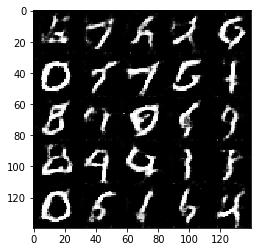

Epoch 1/2... Discriminator Loss: 1.8854... Generator Loss: 0.2779
Epoch 1/2... Discriminator Loss: 1.6674... Generator Loss: 0.3974
Epoch 1/2... Discriminator Loss: 1.6859... Generator Loss: 0.3681
Epoch 1/2... Discriminator Loss: 1.8084... Generator Loss: 0.3145
Epoch 1/2... Discriminator Loss: 1.8170... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 2.2648... Generator Loss: 0.1514
Epoch 1/2... Discriminator Loss: 1.7608... Generator Loss: 0.3101
Epoch 1/2... Discriminator Loss: 1.9084... Generator Loss: 0.3257
Epoch 1/2... Discriminator Loss: 1.9246... Generator Loss: 0.3445
Epoch 1/2... Discriminator Loss: 1.9294... Generator Loss: 0.2867


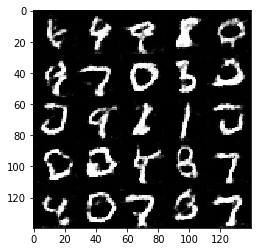

Epoch 1/2... Discriminator Loss: 1.8140... Generator Loss: 0.3450
Epoch 1/2... Discriminator Loss: 1.8551... Generator Loss: 0.3664
Epoch 1/2... Discriminator Loss: 1.9184... Generator Loss: 0.2518
Epoch 1/2... Discriminator Loss: 1.7293... Generator Loss: 0.3423
Epoch 1/2... Discriminator Loss: 1.6845... Generator Loss: 0.3276
Epoch 1/2... Discriminator Loss: 1.8797... Generator Loss: 0.3197
Epoch 1/2... Discriminator Loss: 1.8902... Generator Loss: 0.2698
Epoch 1/2... Discriminator Loss: 1.8095... Generator Loss: 0.2909
Epoch 1/2... Discriminator Loss: 1.6720... Generator Loss: 0.3820
Epoch 1/2... Discriminator Loss: 1.8363... Generator Loss: 0.3744


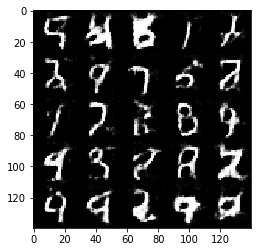

Epoch 1/2... Discriminator Loss: 1.6947... Generator Loss: 0.4223
Epoch 1/2... Discriminator Loss: 1.8092... Generator Loss: 0.3282
Epoch 1/2... Discriminator Loss: 1.7761... Generator Loss: 0.3493
Epoch 1/2... Discriminator Loss: 1.8362... Generator Loss: 0.3108
Epoch 1/2... Discriminator Loss: 1.6998... Generator Loss: 0.4082
Epoch 1/2... Discriminator Loss: 1.7402... Generator Loss: 0.2967
Epoch 1/2... Discriminator Loss: 1.9667... Generator Loss: 0.2556
Epoch 1/2... Discriminator Loss: 1.7830... Generator Loss: 0.3572
Epoch 1/2... Discriminator Loss: 1.8685... Generator Loss: 0.2804
Epoch 1/2... Discriminator Loss: 1.9547... Generator Loss: 0.2560


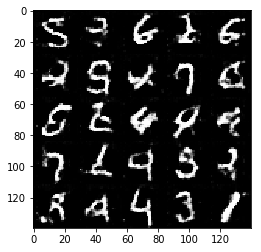

Epoch 1/2... Discriminator Loss: 1.7473... Generator Loss: 0.3745
Epoch 1/2... Discriminator Loss: 1.9460... Generator Loss: 0.2950
Epoch 1/2... Discriminator Loss: 1.7927... Generator Loss: 0.3569
Epoch 1/2... Discriminator Loss: 1.9080... Generator Loss: 0.3606
Epoch 1/2... Discriminator Loss: 2.0283... Generator Loss: 0.2508
Epoch 1/2... Discriminator Loss: 1.7657... Generator Loss: 0.4542
Epoch 1/2... Discriminator Loss: 1.7819... Generator Loss: 0.3895
Epoch 1/2... Discriminator Loss: 1.8436... Generator Loss: 0.4523
Epoch 1/2... Discriminator Loss: 1.9249... Generator Loss: 0.3378
Epoch 1/2... Discriminator Loss: 1.8884... Generator Loss: 0.2357


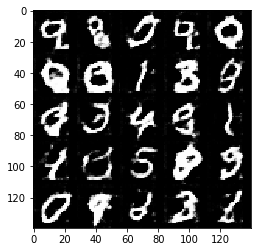

Epoch 1/2... Discriminator Loss: 1.7473... Generator Loss: 0.3090
Epoch 1/2... Discriminator Loss: 1.9625... Generator Loss: 0.3495
Epoch 1/2... Discriminator Loss: 1.9444... Generator Loss: 0.2483
Epoch 1/2... Discriminator Loss: 1.8691... Generator Loss: 0.3185
Epoch 1/2... Discriminator Loss: 2.0043... Generator Loss: 0.2885
Epoch 1/2... Discriminator Loss: 1.9952... Generator Loss: 0.2445
Epoch 1/2... Discriminator Loss: 1.8717... Generator Loss: 0.3690
Epoch 2/2... Discriminator Loss: 1.5266... Generator Loss: 0.4375
Epoch 2/2... Discriminator Loss: 1.6811... Generator Loss: 0.3536
Epoch 2/2... Discriminator Loss: 1.9574... Generator Loss: 0.2960


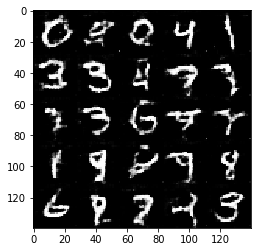

Epoch 2/2... Discriminator Loss: 1.9497... Generator Loss: 0.2751
Epoch 2/2... Discriminator Loss: 1.9292... Generator Loss: 0.3030
Epoch 2/2... Discriminator Loss: 1.6757... Generator Loss: 0.3844
Epoch 2/2... Discriminator Loss: 1.7046... Generator Loss: 0.3869
Epoch 2/2... Discriminator Loss: 1.6838... Generator Loss: 0.3695
Epoch 2/2... Discriminator Loss: 1.6059... Generator Loss: 0.3488
Epoch 2/2... Discriminator Loss: 2.0270... Generator Loss: 0.1983
Epoch 2/2... Discriminator Loss: 1.7756... Generator Loss: 0.3120
Epoch 2/2... Discriminator Loss: 1.6224... Generator Loss: 0.4006
Epoch 2/2... Discriminator Loss: 1.8414... Generator Loss: 0.2611


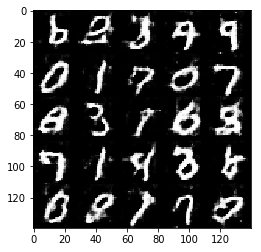

Epoch 2/2... Discriminator Loss: 1.8123... Generator Loss: 0.3800
Epoch 2/2... Discriminator Loss: 1.7156... Generator Loss: 0.3541
Epoch 2/2... Discriminator Loss: 1.8278... Generator Loss: 0.3130
Epoch 2/2... Discriminator Loss: 1.8159... Generator Loss: 0.4708
Epoch 2/2... Discriminator Loss: 1.6528... Generator Loss: 0.3930
Epoch 2/2... Discriminator Loss: 1.6119... Generator Loss: 0.3784
Epoch 2/2... Discriminator Loss: 1.7386... Generator Loss: 0.3578
Epoch 2/2... Discriminator Loss: 1.5774... Generator Loss: 0.3748
Epoch 2/2... Discriminator Loss: 1.8037... Generator Loss: 0.3532
Epoch 2/2... Discriminator Loss: 1.8250... Generator Loss: 0.2715


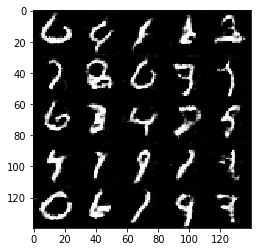

Epoch 2/2... Discriminator Loss: 1.7600... Generator Loss: 0.3429
Epoch 2/2... Discriminator Loss: 1.6641... Generator Loss: 0.4381
Epoch 2/2... Discriminator Loss: 1.6188... Generator Loss: 0.3334
Epoch 2/2... Discriminator Loss: 1.8595... Generator Loss: 0.3433
Epoch 2/2... Discriminator Loss: 1.7333... Generator Loss: 0.3873
Epoch 2/2... Discriminator Loss: 1.8442... Generator Loss: 0.4048
Epoch 2/2... Discriminator Loss: 1.8200... Generator Loss: 0.3439
Epoch 2/2... Discriminator Loss: 1.7247... Generator Loss: 0.3214
Epoch 2/2... Discriminator Loss: 1.8114... Generator Loss: 0.3660
Epoch 2/2... Discriminator Loss: 1.6528... Generator Loss: 0.3072


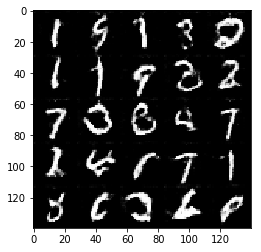

Epoch 2/2... Discriminator Loss: 1.9022... Generator Loss: 0.2295
Epoch 2/2... Discriminator Loss: 1.9038... Generator Loss: 0.3274
Epoch 2/2... Discriminator Loss: 1.7052... Generator Loss: 0.2992
Epoch 2/2... Discriminator Loss: 1.6630... Generator Loss: 0.3220
Epoch 2/2... Discriminator Loss: 1.4220... Generator Loss: 0.4038
Epoch 2/2... Discriminator Loss: 1.7452... Generator Loss: 0.2731
Epoch 2/2... Discriminator Loss: 1.7535... Generator Loss: 0.4577
Epoch 2/2... Discriminator Loss: 1.5389... Generator Loss: 0.3542
Epoch 2/2... Discriminator Loss: 1.5211... Generator Loss: 0.4221
Epoch 2/2... Discriminator Loss: 1.7080... Generator Loss: 0.3762


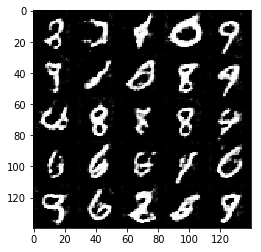

Epoch 2/2... Discriminator Loss: 1.6894... Generator Loss: 0.3572
Epoch 2/2... Discriminator Loss: 1.6618... Generator Loss: 0.3004
Epoch 2/2... Discriminator Loss: 1.6492... Generator Loss: 0.3587
Epoch 2/2... Discriminator Loss: 1.4804... Generator Loss: 0.4487
Epoch 2/2... Discriminator Loss: 2.0077... Generator Loss: 0.2579
Epoch 2/2... Discriminator Loss: 1.5029... Generator Loss: 0.3467
Epoch 2/2... Discriminator Loss: 1.6194... Generator Loss: 0.3783
Epoch 2/2... Discriminator Loss: 1.7145... Generator Loss: 0.4078
Epoch 2/2... Discriminator Loss: 1.7685... Generator Loss: 0.3442
Epoch 2/2... Discriminator Loss: 1.6555... Generator Loss: 0.3827


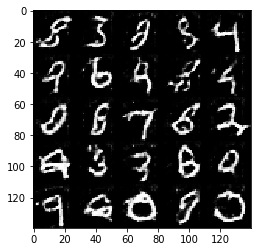

Epoch 2/2... Discriminator Loss: 1.6832... Generator Loss: 0.5004
Epoch 2/2... Discriminator Loss: 1.6714... Generator Loss: 0.3622
Epoch 2/2... Discriminator Loss: 1.6390... Generator Loss: 0.4581
Epoch 2/2... Discriminator Loss: 1.8928... Generator Loss: 0.2752
Epoch 2/2... Discriminator Loss: 1.5164... Generator Loss: 0.4968
Epoch 2/2... Discriminator Loss: 1.6104... Generator Loss: 0.5619
Epoch 2/2... Discriminator Loss: 1.7157... Generator Loss: 0.3525
Epoch 2/2... Discriminator Loss: 1.5374... Generator Loss: 0.5038
Epoch 2/2... Discriminator Loss: 1.6995... Generator Loss: 0.4425
Epoch 2/2... Discriminator Loss: 1.7881... Generator Loss: 0.3645


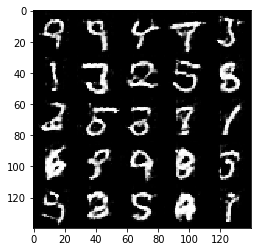

Epoch 2/2... Discriminator Loss: 1.7146... Generator Loss: 0.4100
Epoch 2/2... Discriminator Loss: 1.7322... Generator Loss: 0.4022
Epoch 2/2... Discriminator Loss: 1.8178... Generator Loss: 0.2832
Epoch 2/2... Discriminator Loss: 1.7465... Generator Loss: 0.3516
Epoch 2/2... Discriminator Loss: 1.6100... Generator Loss: 0.4349
Epoch 2/2... Discriminator Loss: 1.5983... Generator Loss: 0.4232
Epoch 2/2... Discriminator Loss: 1.8248... Generator Loss: 0.2416
Epoch 2/2... Discriminator Loss: 1.8482... Generator Loss: 0.5116
Epoch 2/2... Discriminator Loss: 1.5881... Generator Loss: 0.3916
Epoch 2/2... Discriminator Loss: 1.6290... Generator Loss: 0.4361


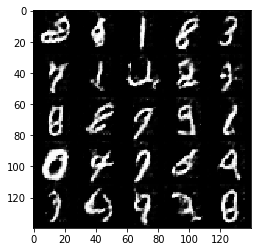

Epoch 2/2... Discriminator Loss: 1.5494... Generator Loss: 0.3557
Epoch 2/2... Discriminator Loss: 1.8098... Generator Loss: 0.3026
Epoch 2/2... Discriminator Loss: 1.6950... Generator Loss: 0.5384
Epoch 2/2... Discriminator Loss: 1.6871... Generator Loss: 0.4430
Epoch 2/2... Discriminator Loss: 1.7208... Generator Loss: 0.3850
Epoch 2/2... Discriminator Loss: 1.7384... Generator Loss: 0.4306
Epoch 2/2... Discriminator Loss: 1.6523... Generator Loss: 0.4107
Epoch 2/2... Discriminator Loss: 1.7027... Generator Loss: 0.3377
Epoch 2/2... Discriminator Loss: 1.4804... Generator Loss: 0.4181
Epoch 2/2... Discriminator Loss: 1.5915... Generator Loss: 0.4648


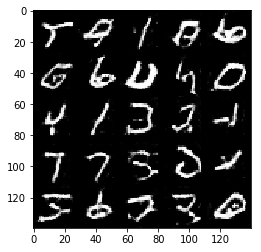

Epoch 2/2... Discriminator Loss: 1.8597... Generator Loss: 0.3420
Epoch 2/2... Discriminator Loss: 1.4834... Generator Loss: 0.5140
Epoch 2/2... Discriminator Loss: 1.5178... Generator Loss: 0.5260
Epoch 2/2... Discriminator Loss: 1.5893... Generator Loss: 0.4398
Epoch 2/2... Discriminator Loss: 1.6707... Generator Loss: 0.3272
Epoch 2/2... Discriminator Loss: 1.6905... Generator Loss: 0.3689
Epoch 2/2... Discriminator Loss: 1.6358... Generator Loss: 0.3822
Epoch 2/2... Discriminator Loss: 1.5512... Generator Loss: 0.3946
Epoch 2/2... Discriminator Loss: 1.7970... Generator Loss: 0.3990
Epoch 2/2... Discriminator Loss: 1.7831... Generator Loss: 0.3293


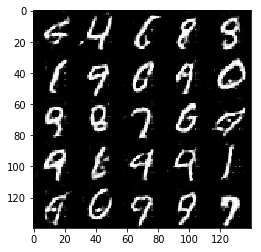

Epoch 2/2... Discriminator Loss: 1.5015... Generator Loss: 0.5578
Epoch 2/2... Discriminator Loss: 1.7467... Generator Loss: 0.3329
Epoch 2/2... Discriminator Loss: 1.7303... Generator Loss: 0.2896
Epoch 2/2... Discriminator Loss: 1.6814... Generator Loss: 0.3399
Epoch 2/2... Discriminator Loss: 1.6911... Generator Loss: 0.3218
Epoch 2/2... Discriminator Loss: 1.6708... Generator Loss: 0.3655
Epoch 2/2... Discriminator Loss: 1.5800... Generator Loss: 0.5669
Epoch 2/2... Discriminator Loss: 1.5785... Generator Loss: 0.4120
Epoch 2/2... Discriminator Loss: 1.4658... Generator Loss: 0.3897
Epoch 2/2... Discriminator Loss: 1.5890... Generator Loss: 0.4399


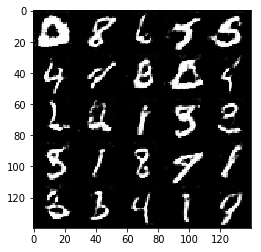

Epoch 2/2... Discriminator Loss: 1.6177... Generator Loss: 0.3605
Epoch 2/2... Discriminator Loss: 1.6491... Generator Loss: 0.3546
Epoch 2/2... Discriminator Loss: 1.8282... Generator Loss: 0.2704
Epoch 2/2... Discriminator Loss: 1.5946... Generator Loss: 0.4599
Epoch 2/2... Discriminator Loss: 1.8362... Generator Loss: 0.2712
Epoch 2/2... Discriminator Loss: 1.6817... Generator Loss: 0.4266
Epoch 2/2... Discriminator Loss: 1.6454... Generator Loss: 0.3680
Epoch 2/2... Discriminator Loss: 1.6986... Generator Loss: 0.4504
Epoch 2/2... Discriminator Loss: 1.4778... Generator Loss: 0.4187
Epoch 2/2... Discriminator Loss: 1.7183... Generator Loss: 0.4306


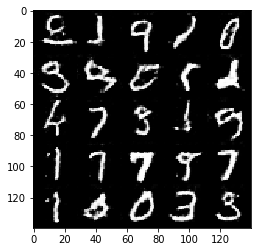

Epoch 2/2... Discriminator Loss: 1.7183... Generator Loss: 0.3682
Epoch 2/2... Discriminator Loss: 1.5701... Generator Loss: 0.5283
Epoch 2/2... Discriminator Loss: 1.5782... Generator Loss: 0.5544
Epoch 2/2... Discriminator Loss: 1.7862... Generator Loss: 0.3294
Epoch 2/2... Discriminator Loss: 1.6239... Generator Loss: 0.4069
Epoch 2/2... Discriminator Loss: 1.6312... Generator Loss: 0.3894
Epoch 2/2... Discriminator Loss: 1.6065... Generator Loss: 0.4663
Epoch 2/2... Discriminator Loss: 1.5811... Generator Loss: 0.5266
Epoch 2/2... Discriminator Loss: 1.5641... Generator Loss: 0.4287
Epoch 2/2... Discriminator Loss: 1.4713... Generator Loss: 0.4496


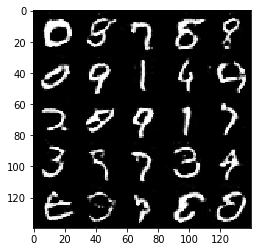

Epoch 2/2... Discriminator Loss: 1.7017... Generator Loss: 0.6138
Epoch 2/2... Discriminator Loss: 1.5818... Generator Loss: 0.4027
Epoch 2/2... Discriminator Loss: 1.6762... Generator Loss: 0.3405
Epoch 2/2... Discriminator Loss: 1.8160... Generator Loss: 0.2704
Epoch 2/2... Discriminator Loss: 1.7240... Generator Loss: 0.2831
Epoch 2/2... Discriminator Loss: 1.7102... Generator Loss: 0.4108
Epoch 2/2... Discriminator Loss: 1.5432... Generator Loss: 0.4004
Epoch 2/2... Discriminator Loss: 1.8123... Generator Loss: 0.2855
Epoch 2/2... Discriminator Loss: 1.5407... Generator Loss: 0.5361
Epoch 2/2... Discriminator Loss: 1.7860... Generator Loss: 0.3965


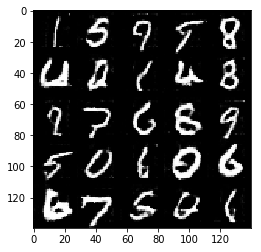

Epoch 2/2... Discriminator Loss: 1.7979... Generator Loss: 0.3386
Epoch 2/2... Discriminator Loss: 1.7072... Generator Loss: 0.4392
Epoch 2/2... Discriminator Loss: 1.5617... Generator Loss: 0.4223
Epoch 2/2... Discriminator Loss: 1.6234... Generator Loss: 0.3460
Epoch 2/2... Discriminator Loss: 1.6760... Generator Loss: 0.4232
Epoch 2/2... Discriminator Loss: 1.6419... Generator Loss: 0.3443
Epoch 2/2... Discriminator Loss: 1.8317... Generator Loss: 0.3990
Epoch 2/2... Discriminator Loss: 1.5577... Generator Loss: 0.4343
Epoch 2/2... Discriminator Loss: 1.6570... Generator Loss: 0.4724
Epoch 2/2... Discriminator Loss: 1.5163... Generator Loss: 0.4245


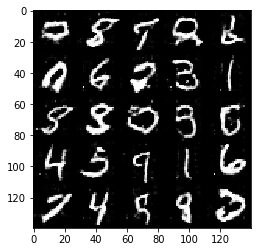

Epoch 2/2... Discriminator Loss: 1.6118... Generator Loss: 0.3497
Epoch 2/2... Discriminator Loss: 1.8272... Generator Loss: 0.3189
Epoch 2/2... Discriminator Loss: 1.7094... Generator Loss: 0.3162
Epoch 2/2... Discriminator Loss: 1.6442... Generator Loss: 0.3992
Epoch 2/2... Discriminator Loss: 1.4485... Generator Loss: 0.4303
Epoch 2/2... Discriminator Loss: 1.6108... Generator Loss: 0.4350
Epoch 2/2... Discriminator Loss: 1.4389... Generator Loss: 0.4654
Epoch 2/2... Discriminator Loss: 1.7207... Generator Loss: 0.3777
Epoch 2/2... Discriminator Loss: 1.5132... Generator Loss: 0.4640
Epoch 2/2... Discriminator Loss: 1.7744... Generator Loss: 0.4576


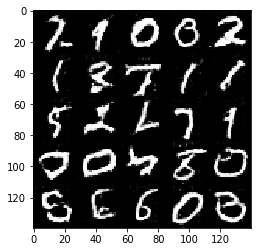

Epoch 2/2... Discriminator Loss: 1.5972... Generator Loss: 0.6069
Epoch 2/2... Discriminator Loss: 1.6520... Generator Loss: 0.3473
Epoch 2/2... Discriminator Loss: 1.5105... Generator Loss: 0.5564
Epoch 2/2... Discriminator Loss: 1.6203... Generator Loss: 0.4830
Epoch 2/2... Discriminator Loss: 1.6241... Generator Loss: 0.3826
Epoch 2/2... Discriminator Loss: 1.7546... Generator Loss: 0.3553
Epoch 2/2... Discriminator Loss: 1.8260... Generator Loss: 0.3254
Epoch 2/2... Discriminator Loss: 1.6498... Generator Loss: 0.3474
Epoch 2/2... Discriminator Loss: 1.4139... Generator Loss: 0.5127
Epoch 2/2... Discriminator Loss: 1.5810... Generator Loss: 0.4995


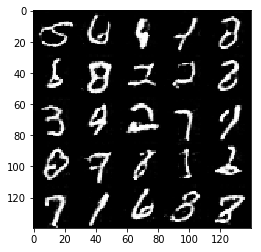

Epoch 2/2... Discriminator Loss: 1.5120... Generator Loss: 0.4777
Epoch 2/2... Discriminator Loss: 1.6380... Generator Loss: 0.3584
Epoch 2/2... Discriminator Loss: 1.3531... Generator Loss: 0.6586
Epoch 2/2... Discriminator Loss: 1.5615... Generator Loss: 0.4997
Epoch 2/2... Discriminator Loss: 1.4765... Generator Loss: 0.3473
Epoch 2/2... Discriminator Loss: 1.5165... Generator Loss: 0.4315
Epoch 2/2... Discriminator Loss: 1.6904... Generator Loss: 0.3708
Epoch 2/2... Discriminator Loss: 1.6625... Generator Loss: 0.4305
Epoch 2/2... Discriminator Loss: 1.7069... Generator Loss: 0.4991
Epoch 2/2... Discriminator Loss: 1.7001... Generator Loss: 0.3167


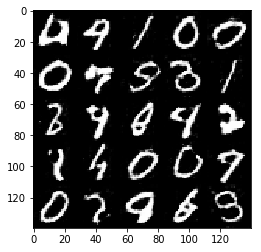

Epoch 2/2... Discriminator Loss: 1.4419... Generator Loss: 0.4966
Epoch 2/2... Discriminator Loss: 1.6768... Generator Loss: 0.4122
Epoch 2/2... Discriminator Loss: 1.3993... Generator Loss: 0.5404
Epoch 2/2... Discriminator Loss: 1.6921... Generator Loss: 0.4928
Epoch 2/2... Discriminator Loss: 1.6687... Generator Loss: 0.4462
Epoch 2/2... Discriminator Loss: 1.4931... Generator Loss: 0.5177
Epoch 2/2... Discriminator Loss: 1.5648... Generator Loss: 0.5076
Epoch 2/2... Discriminator Loss: 1.6217... Generator Loss: 0.4130
Epoch 2/2... Discriminator Loss: 1.6118... Generator Loss: 0.4471
Epoch 2/2... Discriminator Loss: 1.4007... Generator Loss: 0.5283


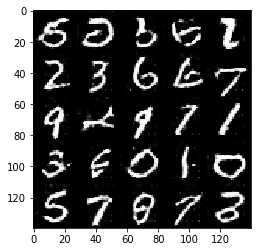

Epoch 2/2... Discriminator Loss: 1.6911... Generator Loss: 0.3785
Epoch 2/2... Discriminator Loss: 1.8346... Generator Loss: 0.3802
Epoch 2/2... Discriminator Loss: 1.5149... Generator Loss: 0.5343
Epoch 2/2... Discriminator Loss: 1.5405... Generator Loss: 0.5379
Epoch 2/2... Discriminator Loss: 1.5896... Generator Loss: 0.5004


In [19]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 14.2043... Generator Loss: 0.0000
Epoch 1/1... Discriminator Loss: 8.2327... Generator Loss: 0.0004
Epoch 1/1... Discriminator Loss: 8.0702... Generator Loss: 0.0010
Epoch 1/1... Discriminator Loss: 5.7728... Generator Loss: 0.0070
Epoch 1/1... Discriminator Loss: 6.1590... Generator Loss: 0.0060
Epoch 1/1... Discriminator Loss: 4.5336... Generator Loss: 0.0220
Epoch 1/1... Discriminator Loss: 4.8235... Generator Loss: 0.0241
Epoch 1/1... Discriminator Loss: 4.8361... Generator Loss: 0.0417
Epoch 1/1... Discriminator Loss: 4.7413... Generator Loss: 0.0328
Epoch 1/1... Discriminator Loss: 3.2752... Generator Loss: 0.0906


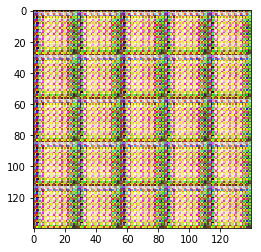

Epoch 1/1... Discriminator Loss: 4.2721... Generator Loss: 0.0468
Epoch 1/1... Discriminator Loss: 3.7338... Generator Loss: 0.0417
Epoch 1/1... Discriminator Loss: 3.4972... Generator Loss: 0.0761
Epoch 1/1... Discriminator Loss: 3.5813... Generator Loss: 0.0499
Epoch 1/1... Discriminator Loss: 3.3559... Generator Loss: 0.0439
Epoch 1/1... Discriminator Loss: 2.5251... Generator Loss: 0.1740
Epoch 1/1... Discriminator Loss: 2.9214... Generator Loss: 0.1308
Epoch 1/1... Discriminator Loss: 2.8767... Generator Loss: 0.0923
Epoch 1/1... Discriminator Loss: 3.6304... Generator Loss: 0.0454
Epoch 1/1... Discriminator Loss: 3.0235... Generator Loss: 0.1208


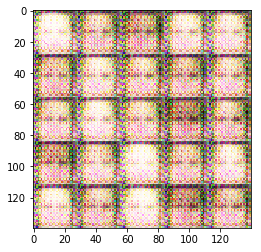

Epoch 1/1... Discriminator Loss: 2.9647... Generator Loss: 0.1615
Epoch 1/1... Discriminator Loss: 3.2406... Generator Loss: 0.0924
Epoch 1/1... Discriminator Loss: 2.9791... Generator Loss: 0.1021
Epoch 1/1... Discriminator Loss: 2.7777... Generator Loss: 0.1165
Epoch 1/1... Discriminator Loss: 2.3784... Generator Loss: 0.1560
Epoch 1/1... Discriminator Loss: 3.6076... Generator Loss: 0.0598
Epoch 1/1... Discriminator Loss: 2.5520... Generator Loss: 0.1615
Epoch 1/1... Discriminator Loss: 2.0385... Generator Loss: 0.3011
Epoch 1/1... Discriminator Loss: 2.8633... Generator Loss: 0.1281
Epoch 1/1... Discriminator Loss: 3.4313... Generator Loss: 0.0922


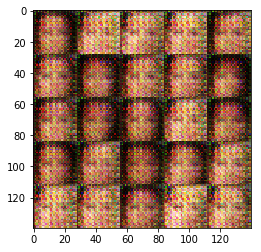

Epoch 1/1... Discriminator Loss: 2.7346... Generator Loss: 0.1435
Epoch 1/1... Discriminator Loss: 2.8764... Generator Loss: 0.1166
Epoch 1/1... Discriminator Loss: 3.2910... Generator Loss: 0.0647
Epoch 1/1... Discriminator Loss: 2.7202... Generator Loss: 0.1209
Epoch 1/1... Discriminator Loss: 2.4814... Generator Loss: 0.1476
Epoch 1/1... Discriminator Loss: 1.9977... Generator Loss: 0.2549
Epoch 1/1... Discriminator Loss: 2.2673... Generator Loss: 0.2130
Epoch 1/1... Discriminator Loss: 2.3308... Generator Loss: 0.1817
Epoch 1/1... Discriminator Loss: 2.4890... Generator Loss: 0.1633
Epoch 1/1... Discriminator Loss: 2.6322... Generator Loss: 0.1091


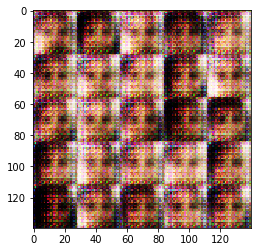

Epoch 1/1... Discriminator Loss: 2.2725... Generator Loss: 0.2484
Epoch 1/1... Discriminator Loss: 2.3234... Generator Loss: 0.1782
Epoch 1/1... Discriminator Loss: 2.2416... Generator Loss: 0.1680
Epoch 1/1... Discriminator Loss: 2.2979... Generator Loss: 0.2010
Epoch 1/1... Discriminator Loss: 2.2072... Generator Loss: 0.2157
Epoch 1/1... Discriminator Loss: 3.1535... Generator Loss: 0.0681
Epoch 1/1... Discriminator Loss: 2.3380... Generator Loss: 0.2005
Epoch 1/1... Discriminator Loss: 2.3096... Generator Loss: 0.1939
Epoch 1/1... Discriminator Loss: 2.2509... Generator Loss: 0.1752
Epoch 1/1... Discriminator Loss: 2.4041... Generator Loss: 0.2145


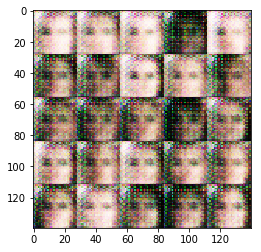

Epoch 1/1... Discriminator Loss: 2.3741... Generator Loss: 0.1589
Epoch 1/1... Discriminator Loss: 2.7567... Generator Loss: 0.1428
Epoch 1/1... Discriminator Loss: 2.4540... Generator Loss: 0.1402
Epoch 1/1... Discriminator Loss: 3.1568... Generator Loss: 0.1007
Epoch 1/1... Discriminator Loss: 2.1164... Generator Loss: 0.2156
Epoch 1/1... Discriminator Loss: 2.0346... Generator Loss: 0.2427
Epoch 1/1... Discriminator Loss: 2.5185... Generator Loss: 0.1504
Epoch 1/1... Discriminator Loss: 2.5912... Generator Loss: 0.1984
Epoch 1/1... Discriminator Loss: 2.5521... Generator Loss: 0.1643
Epoch 1/1... Discriminator Loss: 2.5737... Generator Loss: 0.1521


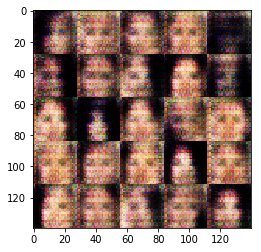

Epoch 1/1... Discriminator Loss: 2.9053... Generator Loss: 0.1111
Epoch 1/1... Discriminator Loss: 2.4262... Generator Loss: 0.1631
Epoch 1/1... Discriminator Loss: 2.1643... Generator Loss: 0.2068
Epoch 1/1... Discriminator Loss: 1.9257... Generator Loss: 0.2711
Epoch 1/1... Discriminator Loss: 2.3945... Generator Loss: 0.1830
Epoch 1/1... Discriminator Loss: 2.5568... Generator Loss: 0.1340
Epoch 1/1... Discriminator Loss: 2.2847... Generator Loss: 0.1997
Epoch 1/1... Discriminator Loss: 2.8082... Generator Loss: 0.1211
Epoch 1/1... Discriminator Loss: 2.1861... Generator Loss: 0.2256
Epoch 1/1... Discriminator Loss: 1.7948... Generator Loss: 0.3031


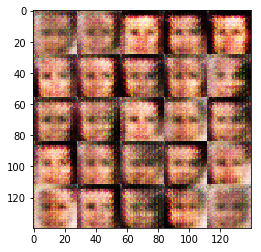

Epoch 1/1... Discriminator Loss: 2.2742... Generator Loss: 0.1884
Epoch 1/1... Discriminator Loss: 2.1308... Generator Loss: 0.2722
Epoch 1/1... Discriminator Loss: 2.1296... Generator Loss: 0.2535
Epoch 1/1... Discriminator Loss: 2.2331... Generator Loss: 0.2352
Epoch 1/1... Discriminator Loss: 2.4475... Generator Loss: 0.1726
Epoch 1/1... Discriminator Loss: 1.7472... Generator Loss: 0.2873
Epoch 1/1... Discriminator Loss: 2.9794... Generator Loss: 0.1063
Epoch 1/1... Discriminator Loss: 2.2955... Generator Loss: 0.1760
Epoch 1/1... Discriminator Loss: 2.5969... Generator Loss: 0.1527
Epoch 1/1... Discriminator Loss: 2.6173... Generator Loss: 0.1416


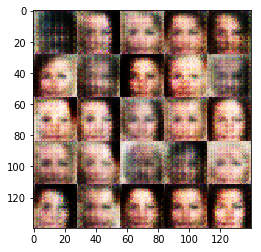

Epoch 1/1... Discriminator Loss: 2.3674... Generator Loss: 0.2351
Epoch 1/1... Discriminator Loss: 2.3048... Generator Loss: 0.1912
Epoch 1/1... Discriminator Loss: 1.9542... Generator Loss: 0.2492
Epoch 1/1... Discriminator Loss: 2.4034... Generator Loss: 0.2231
Epoch 1/1... Discriminator Loss: 2.3373... Generator Loss: 0.2228
Epoch 1/1... Discriminator Loss: 2.4336... Generator Loss: 0.1911
Epoch 1/1... Discriminator Loss: 2.0993... Generator Loss: 0.2448
Epoch 1/1... Discriminator Loss: 2.1328... Generator Loss: 0.2566
Epoch 1/1... Discriminator Loss: 1.5366... Generator Loss: 0.4378
Epoch 1/1... Discriminator Loss: 2.3183... Generator Loss: 0.1856


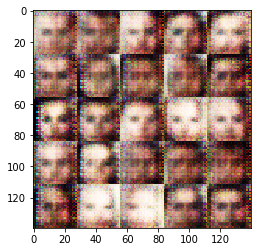

Epoch 1/1... Discriminator Loss: 1.9546... Generator Loss: 0.2905
Epoch 1/1... Discriminator Loss: 2.1116... Generator Loss: 0.2211
Epoch 1/1... Discriminator Loss: 2.6338... Generator Loss: 0.1598
Epoch 1/1... Discriminator Loss: 2.2379... Generator Loss: 0.2412
Epoch 1/1... Discriminator Loss: 2.0498... Generator Loss: 0.2310
Epoch 1/1... Discriminator Loss: 2.2266... Generator Loss: 0.2044
Epoch 1/1... Discriminator Loss: 2.4051... Generator Loss: 0.2011
Epoch 1/1... Discriminator Loss: 2.0528... Generator Loss: 0.2599
Epoch 1/1... Discriminator Loss: 2.3184... Generator Loss: 0.2060
Epoch 1/1... Discriminator Loss: 1.6996... Generator Loss: 0.3267


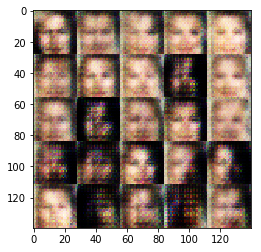

Epoch 1/1... Discriminator Loss: 2.1294... Generator Loss: 0.2668
Epoch 1/1... Discriminator Loss: 2.3127... Generator Loss: 0.1762
Epoch 1/1... Discriminator Loss: 2.3322... Generator Loss: 0.1931
Epoch 1/1... Discriminator Loss: 2.1983... Generator Loss: 0.1957
Epoch 1/1... Discriminator Loss: 2.1181... Generator Loss: 0.2741
Epoch 1/1... Discriminator Loss: 2.2521... Generator Loss: 0.2081
Epoch 1/1... Discriminator Loss: 1.9106... Generator Loss: 0.2746
Epoch 1/1... Discriminator Loss: 2.0515... Generator Loss: 0.2528
Epoch 1/1... Discriminator Loss: 2.1654... Generator Loss: 0.1971
Epoch 1/1... Discriminator Loss: 1.8748... Generator Loss: 0.2675


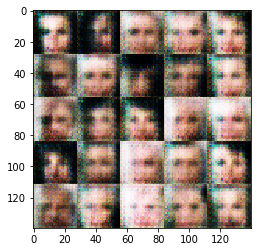

Epoch 1/1... Discriminator Loss: 1.9910... Generator Loss: 0.2986
Epoch 1/1... Discriminator Loss: 1.8649... Generator Loss: 0.2947
Epoch 1/1... Discriminator Loss: 1.7721... Generator Loss: 0.3500
Epoch 1/1... Discriminator Loss: 1.9381... Generator Loss: 0.2644
Epoch 1/1... Discriminator Loss: 2.2723... Generator Loss: 0.2329
Epoch 1/1... Discriminator Loss: 1.9479... Generator Loss: 0.3282
Epoch 1/1... Discriminator Loss: 1.8879... Generator Loss: 0.2628
Epoch 1/1... Discriminator Loss: 2.2292... Generator Loss: 0.2154
Epoch 1/1... Discriminator Loss: 2.2506... Generator Loss: 0.2124
Epoch 1/1... Discriminator Loss: 1.8487... Generator Loss: 0.3070


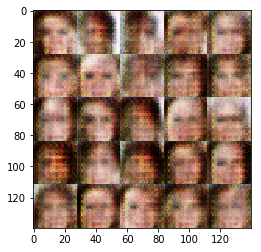

Epoch 1/1... Discriminator Loss: 1.6670... Generator Loss: 0.3619
Epoch 1/1... Discriminator Loss: 1.7848... Generator Loss: 0.3096
Epoch 1/1... Discriminator Loss: 2.7366... Generator Loss: 0.1412
Epoch 1/1... Discriminator Loss: 1.9869... Generator Loss: 0.2305
Epoch 1/1... Discriminator Loss: 1.7097... Generator Loss: 0.3866
Epoch 1/1... Discriminator Loss: 1.7096... Generator Loss: 0.3599
Epoch 1/1... Discriminator Loss: 2.5477... Generator Loss: 0.1609
Epoch 1/1... Discriminator Loss: 2.3741... Generator Loss: 0.1892
Epoch 1/1... Discriminator Loss: 2.2563... Generator Loss: 0.2597
Epoch 1/1... Discriminator Loss: 2.0853... Generator Loss: 0.2928


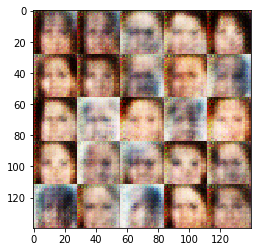

Epoch 1/1... Discriminator Loss: 1.8292... Generator Loss: 0.2797
Epoch 1/1... Discriminator Loss: 1.9163... Generator Loss: 0.3005
Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 0.4107
Epoch 1/1... Discriminator Loss: 1.6239... Generator Loss: 0.3913
Epoch 1/1... Discriminator Loss: 2.0855... Generator Loss: 0.2162
Epoch 1/1... Discriminator Loss: 1.6179... Generator Loss: 0.4159
Epoch 1/1... Discriminator Loss: 1.9592... Generator Loss: 0.2834
Epoch 1/1... Discriminator Loss: 1.9891... Generator Loss: 0.3066
Epoch 1/1... Discriminator Loss: 1.9291... Generator Loss: 0.2837
Epoch 1/1... Discriminator Loss: 1.9516... Generator Loss: 0.2437


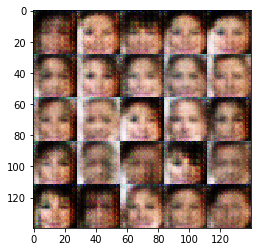

Epoch 1/1... Discriminator Loss: 2.1690... Generator Loss: 0.2572
Epoch 1/1... Discriminator Loss: 2.0823... Generator Loss: 0.2414
Epoch 1/1... Discriminator Loss: 1.7153... Generator Loss: 0.3472
Epoch 1/1... Discriminator Loss: 2.0228... Generator Loss: 0.2722
Epoch 1/1... Discriminator Loss: 2.1641... Generator Loss: 0.1983
Epoch 1/1... Discriminator Loss: 2.0789... Generator Loss: 0.2696
Epoch 1/1... Discriminator Loss: 2.2158... Generator Loss: 0.1956
Epoch 1/1... Discriminator Loss: 2.0841... Generator Loss: 0.2355
Epoch 1/1... Discriminator Loss: 1.8869... Generator Loss: 0.2554
Epoch 1/1... Discriminator Loss: 1.9268... Generator Loss: 0.3542


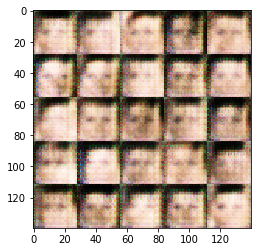

Epoch 1/1... Discriminator Loss: 1.5694... Generator Loss: 0.4806
Epoch 1/1... Discriminator Loss: 1.7523... Generator Loss: 0.3462
Epoch 1/1... Discriminator Loss: 1.7020... Generator Loss: 0.3504
Epoch 1/1... Discriminator Loss: 1.8427... Generator Loss: 0.2995
Epoch 1/1... Discriminator Loss: 1.7570... Generator Loss: 0.4625
Epoch 1/1... Discriminator Loss: 1.8685... Generator Loss: 0.3144
Epoch 1/1... Discriminator Loss: 1.6820... Generator Loss: 0.3724
Epoch 1/1... Discriminator Loss: 1.9424... Generator Loss: 0.2409
Epoch 1/1... Discriminator Loss: 2.0283... Generator Loss: 0.2993
Epoch 1/1... Discriminator Loss: 1.7991... Generator Loss: 0.3902


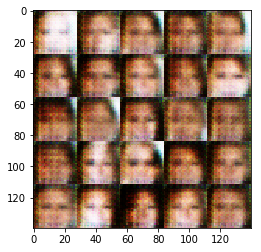

Epoch 1/1... Discriminator Loss: 1.6056... Generator Loss: 0.4691
Epoch 1/1... Discriminator Loss: 2.0218... Generator Loss: 0.3107
Epoch 1/1... Discriminator Loss: 1.9461... Generator Loss: 0.3215
Epoch 1/1... Discriminator Loss: 1.7116... Generator Loss: 0.3622
Epoch 1/1... Discriminator Loss: 2.6242... Generator Loss: 0.1550
Epoch 1/1... Discriminator Loss: 2.0513... Generator Loss: 0.2739
Epoch 1/1... Discriminator Loss: 1.9978... Generator Loss: 0.3223
Epoch 1/1... Discriminator Loss: 1.9536... Generator Loss: 0.2738
Epoch 1/1... Discriminator Loss: 1.9668... Generator Loss: 0.2271
Epoch 1/1... Discriminator Loss: 2.0217... Generator Loss: 0.3079


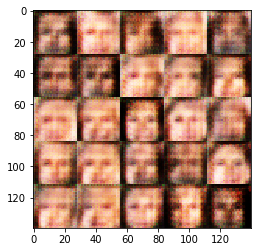

Epoch 1/1... Discriminator Loss: 1.9912... Generator Loss: 0.3204
Epoch 1/1... Discriminator Loss: 1.8615... Generator Loss: 0.3074
Epoch 1/1... Discriminator Loss: 1.8579... Generator Loss: 0.2978
Epoch 1/1... Discriminator Loss: 1.8979... Generator Loss: 0.2915
Epoch 1/1... Discriminator Loss: 1.8839... Generator Loss: 0.2813
Epoch 1/1... Discriminator Loss: 1.9861... Generator Loss: 0.2962
Epoch 1/1... Discriminator Loss: 1.8707... Generator Loss: 0.3007
Epoch 1/1... Discriminator Loss: 2.0125... Generator Loss: 0.3093
Epoch 1/1... Discriminator Loss: 1.8750... Generator Loss: 0.3387
Epoch 1/1... Discriminator Loss: 1.7389... Generator Loss: 0.3367


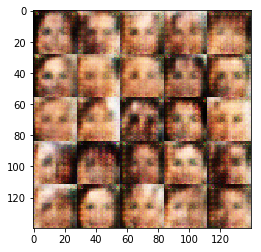

Epoch 1/1... Discriminator Loss: 1.8020... Generator Loss: 0.4068
Epoch 1/1... Discriminator Loss: 2.0434... Generator Loss: 0.2636
Epoch 1/1... Discriminator Loss: 2.0018... Generator Loss: 0.2513
Epoch 1/1... Discriminator Loss: 1.8531... Generator Loss: 0.2982
Epoch 1/1... Discriminator Loss: 2.2561... Generator Loss: 0.2696
Epoch 1/1... Discriminator Loss: 1.9429... Generator Loss: 0.3260
Epoch 1/1... Discriminator Loss: 1.6465... Generator Loss: 0.4275
Epoch 1/1... Discriminator Loss: 1.5865... Generator Loss: 0.3602
Epoch 1/1... Discriminator Loss: 1.7245... Generator Loss: 0.3743
Epoch 1/1... Discriminator Loss: 1.7701... Generator Loss: 0.3755


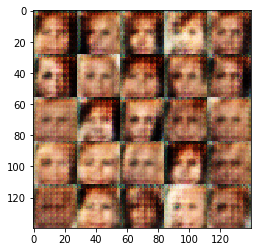

Epoch 1/1... Discriminator Loss: 1.5521... Generator Loss: 0.4315
Epoch 1/1... Discriminator Loss: 1.7358... Generator Loss: 0.3017
Epoch 1/1... Discriminator Loss: 1.9907... Generator Loss: 0.3245
Epoch 1/1... Discriminator Loss: 2.1409... Generator Loss: 0.2808
Epoch 1/1... Discriminator Loss: 1.6483... Generator Loss: 0.3425
Epoch 1/1... Discriminator Loss: 2.1272... Generator Loss: 0.2259
Epoch 1/1... Discriminator Loss: 1.6203... Generator Loss: 0.3693
Epoch 1/1... Discriminator Loss: 2.0859... Generator Loss: 0.2604
Epoch 1/1... Discriminator Loss: 1.8552... Generator Loss: 0.2978
Epoch 1/1... Discriminator Loss: 1.8706... Generator Loss: 0.2907


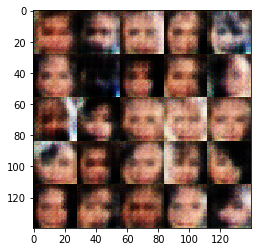

Epoch 1/1... Discriminator Loss: 2.0038... Generator Loss: 0.2290
Epoch 1/1... Discriminator Loss: 1.9910... Generator Loss: 0.3280
Epoch 1/1... Discriminator Loss: 1.9263... Generator Loss: 0.2852
Epoch 1/1... Discriminator Loss: 1.8662... Generator Loss: 0.3106
Epoch 1/1... Discriminator Loss: 1.6413... Generator Loss: 0.4371
Epoch 1/1... Discriminator Loss: 1.6911... Generator Loss: 0.3833
Epoch 1/1... Discriminator Loss: 2.3042... Generator Loss: 0.1829
Epoch 1/1... Discriminator Loss: 2.5133... Generator Loss: 0.2216
Epoch 1/1... Discriminator Loss: 2.4349... Generator Loss: 0.1856
Epoch 1/1... Discriminator Loss: 1.8535... Generator Loss: 0.2695


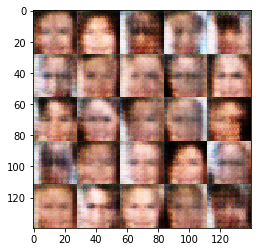

Epoch 1/1... Discriminator Loss: 2.0402... Generator Loss: 0.2847
Epoch 1/1... Discriminator Loss: 1.5934... Generator Loss: 0.4075
Epoch 1/1... Discriminator Loss: 1.9379... Generator Loss: 0.2876
Epoch 1/1... Discriminator Loss: 1.9271... Generator Loss: 0.2505
Epoch 1/1... Discriminator Loss: 2.0214... Generator Loss: 0.2763
Epoch 1/1... Discriminator Loss: 2.0151... Generator Loss: 0.2804
Epoch 1/1... Discriminator Loss: 2.5642... Generator Loss: 0.1796
Epoch 1/1... Discriminator Loss: 1.8548... Generator Loss: 0.3257
Epoch 1/1... Discriminator Loss: 1.8426... Generator Loss: 0.3387
Epoch 1/1... Discriminator Loss: 1.7591... Generator Loss: 0.3318


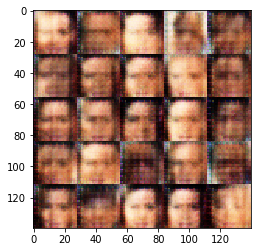

Epoch 1/1... Discriminator Loss: 1.7075... Generator Loss: 0.3373
Epoch 1/1... Discriminator Loss: 2.1562... Generator Loss: 0.2154
Epoch 1/1... Discriminator Loss: 2.2446... Generator Loss: 0.2265
Epoch 1/1... Discriminator Loss: 1.8330... Generator Loss: 0.3042
Epoch 1/1... Discriminator Loss: 1.8902... Generator Loss: 0.3158
Epoch 1/1... Discriminator Loss: 1.7638... Generator Loss: 0.3856
Epoch 1/1... Discriminator Loss: 1.7292... Generator Loss: 0.3540
Epoch 1/1... Discriminator Loss: 1.9752... Generator Loss: 0.3561
Epoch 1/1... Discriminator Loss: 1.9243... Generator Loss: 0.2926
Epoch 1/1... Discriminator Loss: 1.9100... Generator Loss: 0.2967


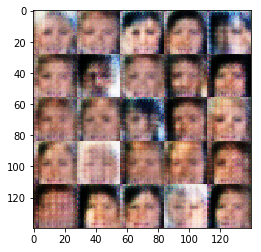

Epoch 1/1... Discriminator Loss: 1.8250... Generator Loss: 0.3252
Epoch 1/1... Discriminator Loss: 2.0776... Generator Loss: 0.2541
Epoch 1/1... Discriminator Loss: 2.0872... Generator Loss: 0.2778
Epoch 1/1... Discriminator Loss: 1.8240... Generator Loss: 0.3659
Epoch 1/1... Discriminator Loss: 1.8221... Generator Loss: 0.3769
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 0.4715
Epoch 1/1... Discriminator Loss: 1.7554... Generator Loss: 0.4034
Epoch 1/1... Discriminator Loss: 1.9311... Generator Loss: 0.2517
Epoch 1/1... Discriminator Loss: 1.6955... Generator Loss: 0.3905
Epoch 1/1... Discriminator Loss: 1.7130... Generator Loss: 0.3657


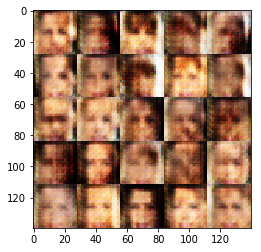

Epoch 1/1... Discriminator Loss: 1.8743... Generator Loss: 0.3257
Epoch 1/1... Discriminator Loss: 2.1353... Generator Loss: 0.3189
Epoch 1/1... Discriminator Loss: 1.4740... Generator Loss: 0.4609
Epoch 1/1... Discriminator Loss: 1.8166... Generator Loss: 0.3468
Epoch 1/1... Discriminator Loss: 1.7636... Generator Loss: 0.3888
Epoch 1/1... Discriminator Loss: 1.8803... Generator Loss: 0.3157
Epoch 1/1... Discriminator Loss: 1.7856... Generator Loss: 0.3552
Epoch 1/1... Discriminator Loss: 1.8183... Generator Loss: 0.3391
Epoch 1/1... Discriminator Loss: 2.0530... Generator Loss: 0.2763
Epoch 1/1... Discriminator Loss: 1.9402... Generator Loss: 0.2997


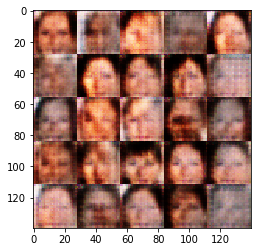

Epoch 1/1... Discriminator Loss: 1.8949... Generator Loss: 0.3085
Epoch 1/1... Discriminator Loss: 1.9417... Generator Loss: 0.3066
Epoch 1/1... Discriminator Loss: 1.9364... Generator Loss: 0.3138
Epoch 1/1... Discriminator Loss: 1.8167... Generator Loss: 0.3882
Epoch 1/1... Discriminator Loss: 2.0210... Generator Loss: 0.2769
Epoch 1/1... Discriminator Loss: 1.5280... Generator Loss: 0.4275
Epoch 1/1... Discriminator Loss: 1.6655... Generator Loss: 0.3713
Epoch 1/1... Discriminator Loss: 1.8516... Generator Loss: 0.3336
Epoch 1/1... Discriminator Loss: 1.8531... Generator Loss: 0.2820
Epoch 1/1... Discriminator Loss: 1.9541... Generator Loss: 0.2888


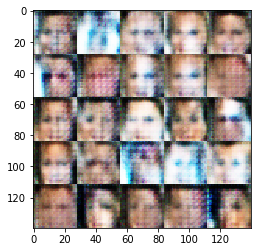

Epoch 1/1... Discriminator Loss: 1.9310... Generator Loss: 0.3147
Epoch 1/1... Discriminator Loss: 1.9801... Generator Loss: 0.2855
Epoch 1/1... Discriminator Loss: 1.9172... Generator Loss: 0.2776
Epoch 1/1... Discriminator Loss: 1.8627... Generator Loss: 0.3282
Epoch 1/1... Discriminator Loss: 1.5890... Generator Loss: 0.4758
Epoch 1/1... Discriminator Loss: 1.5249... Generator Loss: 0.4957
Epoch 1/1... Discriminator Loss: 1.7354... Generator Loss: 0.3894
Epoch 1/1... Discriminator Loss: 2.0187... Generator Loss: 0.2612
Epoch 1/1... Discriminator Loss: 1.6053... Generator Loss: 0.4294
Epoch 1/1... Discriminator Loss: 1.6742... Generator Loss: 0.3728


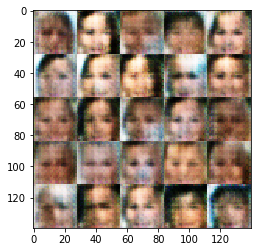

Epoch 1/1... Discriminator Loss: 1.8492... Generator Loss: 0.3806
Epoch 1/1... Discriminator Loss: 1.8493... Generator Loss: 0.2932
Epoch 1/1... Discriminator Loss: 2.0803... Generator Loss: 0.2525
Epoch 1/1... Discriminator Loss: 1.7564... Generator Loss: 0.4067
Epoch 1/1... Discriminator Loss: 1.6748... Generator Loss: 0.3728
Epoch 1/1... Discriminator Loss: 1.8608... Generator Loss: 0.2722
Epoch 1/1... Discriminator Loss: 1.9304... Generator Loss: 0.2880
Epoch 1/1... Discriminator Loss: 1.6848... Generator Loss: 0.4089
Epoch 1/1... Discriminator Loss: 1.5325... Generator Loss: 0.4237
Epoch 1/1... Discriminator Loss: 1.9235... Generator Loss: 0.3430


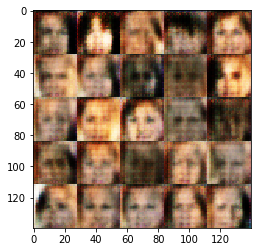

Epoch 1/1... Discriminator Loss: 1.7812... Generator Loss: 0.3998
Epoch 1/1... Discriminator Loss: 1.8971... Generator Loss: 0.3507
Epoch 1/1... Discriminator Loss: 2.0327... Generator Loss: 0.2254
Epoch 1/1... Discriminator Loss: 1.7611... Generator Loss: 0.3647
Epoch 1/1... Discriminator Loss: 1.7570... Generator Loss: 0.3999
Epoch 1/1... Discriminator Loss: 1.5874... Generator Loss: 0.4291
Epoch 1/1... Discriminator Loss: 1.9040... Generator Loss: 0.2549
Epoch 1/1... Discriminator Loss: 1.9875... Generator Loss: 0.2707
Epoch 1/1... Discriminator Loss: 1.8191... Generator Loss: 0.2882
Epoch 1/1... Discriminator Loss: 1.5952... Generator Loss: 0.4572


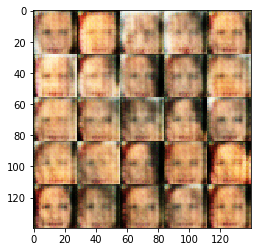

Epoch 1/1... Discriminator Loss: 1.8953... Generator Loss: 0.3416
Epoch 1/1... Discriminator Loss: 1.6594... Generator Loss: 0.4309
Epoch 1/1... Discriminator Loss: 1.8524... Generator Loss: 0.3218
Epoch 1/1... Discriminator Loss: 1.8899... Generator Loss: 0.3415
Epoch 1/1... Discriminator Loss: 1.5872... Generator Loss: 0.4157
Epoch 1/1... Discriminator Loss: 1.6521... Generator Loss: 0.3663
Epoch 1/1... Discriminator Loss: 1.6235... Generator Loss: 0.4833
Epoch 1/1... Discriminator Loss: 1.9638... Generator Loss: 0.3238
Epoch 1/1... Discriminator Loss: 1.5099... Generator Loss: 0.4162
Epoch 1/1... Discriminator Loss: 1.9931... Generator Loss: 0.2240


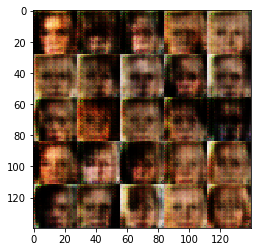

Epoch 1/1... Discriminator Loss: 1.8750... Generator Loss: 0.2617
Epoch 1/1... Discriminator Loss: 1.8416... Generator Loss: 0.3482
Epoch 1/1... Discriminator Loss: 1.9912... Generator Loss: 0.2632
Epoch 1/1... Discriminator Loss: 1.7487... Generator Loss: 0.3558
Epoch 1/1... Discriminator Loss: 2.3306... Generator Loss: 0.2096
Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.4168
Epoch 1/1... Discriminator Loss: 1.6195... Generator Loss: 0.4599
Epoch 1/1... Discriminator Loss: 2.0222... Generator Loss: 0.3503
Epoch 1/1... Discriminator Loss: 1.8444... Generator Loss: 0.3741
Epoch 1/1... Discriminator Loss: 1.5167... Generator Loss: 0.4380


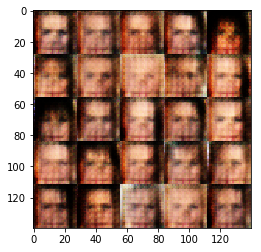

Epoch 1/1... Discriminator Loss: 1.7607... Generator Loss: 0.3637
Epoch 1/1... Discriminator Loss: 1.6204... Generator Loss: 0.4218
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.4695
Epoch 1/1... Discriminator Loss: 2.1128... Generator Loss: 0.2664
Epoch 1/1... Discriminator Loss: 1.5352... Generator Loss: 0.5704
Epoch 1/1... Discriminator Loss: 1.8244... Generator Loss: 0.2975
Epoch 1/1... Discriminator Loss: 1.6842... Generator Loss: 0.4034
Epoch 1/1... Discriminator Loss: 1.9440... Generator Loss: 0.3407
Epoch 1/1... Discriminator Loss: 1.5980... Generator Loss: 0.4523
Epoch 1/1... Discriminator Loss: 1.6739... Generator Loss: 0.4262


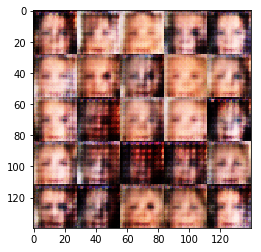

Epoch 1/1... Discriminator Loss: 1.9566... Generator Loss: 0.2554
Epoch 1/1... Discriminator Loss: 1.6662... Generator Loss: 0.4397
Epoch 1/1... Discriminator Loss: 1.6313... Generator Loss: 0.4106
Epoch 1/1... Discriminator Loss: 1.6793... Generator Loss: 0.4272
Epoch 1/1... Discriminator Loss: 1.9821... Generator Loss: 0.3233
Epoch 1/1... Discriminator Loss: 1.9597... Generator Loss: 0.3250
Epoch 1/1... Discriminator Loss: 1.8128... Generator Loss: 0.3634
Epoch 1/1... Discriminator Loss: 1.7576... Generator Loss: 0.3874
Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 0.5150
Epoch 1/1... Discriminator Loss: 1.6001... Generator Loss: 0.4563


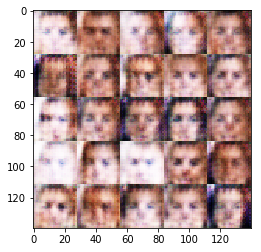

Epoch 1/1... Discriminator Loss: 1.9356... Generator Loss: 0.2915
Epoch 1/1... Discriminator Loss: 1.7527... Generator Loss: 0.4042
Epoch 1/1... Discriminator Loss: 1.8171... Generator Loss: 0.3304
Epoch 1/1... Discriminator Loss: 1.8056... Generator Loss: 0.3969
Epoch 1/1... Discriminator Loss: 1.6840... Generator Loss: 0.3943
Epoch 1/1... Discriminator Loss: 1.4409... Generator Loss: 0.4801
Epoch 1/1... Discriminator Loss: 1.7418... Generator Loss: 0.3779
Epoch 1/1... Discriminator Loss: 1.6179... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 1.5728... Generator Loss: 0.4543
Epoch 1/1... Discriminator Loss: 1.4762... Generator Loss: 0.5110


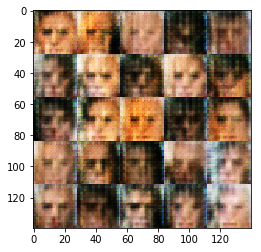

Epoch 1/1... Discriminator Loss: 1.7976... Generator Loss: 0.3761
Epoch 1/1... Discriminator Loss: 1.6220... Generator Loss: 0.3708
Epoch 1/1... Discriminator Loss: 1.8900... Generator Loss: 0.2801
Epoch 1/1... Discriminator Loss: 2.0091... Generator Loss: 0.2746
Epoch 1/1... Discriminator Loss: 1.8866... Generator Loss: 0.2958
Epoch 1/1... Discriminator Loss: 1.3404... Generator Loss: 0.6151
Epoch 1/1... Discriminator Loss: 1.5396... Generator Loss: 0.5055
Epoch 1/1... Discriminator Loss: 1.6685... Generator Loss: 0.4354
Epoch 1/1... Discriminator Loss: 1.8577... Generator Loss: 0.3428
Epoch 1/1... Discriminator Loss: 1.6506... Generator Loss: 0.4615


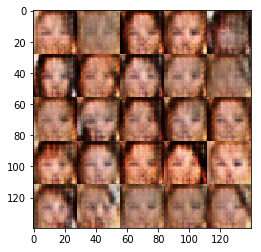

Epoch 1/1... Discriminator Loss: 1.5217... Generator Loss: 0.4620
Epoch 1/1... Discriminator Loss: 1.4366... Generator Loss: 0.5113
Epoch 1/1... Discriminator Loss: 2.0253... Generator Loss: 0.3172
Epoch 1/1... Discriminator Loss: 1.6597... Generator Loss: 0.4122
Epoch 1/1... Discriminator Loss: 1.5352... Generator Loss: 0.5254
Epoch 1/1... Discriminator Loss: 1.9836... Generator Loss: 0.3433
Epoch 1/1... Discriminator Loss: 1.6379... Generator Loss: 0.4123
Epoch 1/1... Discriminator Loss: 1.5953... Generator Loss: 0.5110
Epoch 1/1... Discriminator Loss: 1.6347... Generator Loss: 0.4303
Epoch 1/1... Discriminator Loss: 1.7336... Generator Loss: 0.3684


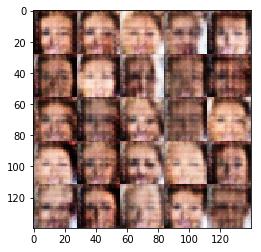

Epoch 1/1... Discriminator Loss: 1.7350... Generator Loss: 0.4290
Epoch 1/1... Discriminator Loss: 1.5595... Generator Loss: 0.4555
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.5275
Epoch 1/1... Discriminator Loss: 1.5100... Generator Loss: 0.4673
Epoch 1/1... Discriminator Loss: 1.5455... Generator Loss: 0.4183
Epoch 1/1... Discriminator Loss: 1.7078... Generator Loss: 0.3385
Epoch 1/1... Discriminator Loss: 1.5912... Generator Loss: 0.4307
Epoch 1/1... Discriminator Loss: 1.6490... Generator Loss: 0.5016
Epoch 1/1... Discriminator Loss: 1.7928... Generator Loss: 0.4062
Epoch 1/1... Discriminator Loss: 1.6324... Generator Loss: 0.4227


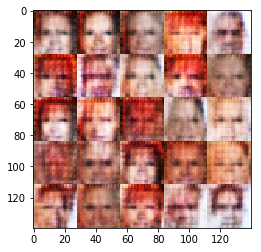

Epoch 1/1... Discriminator Loss: 1.8967... Generator Loss: 0.3837
Epoch 1/1... Discriminator Loss: 1.6049... Generator Loss: 0.4666
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.5743
Epoch 1/1... Discriminator Loss: 1.7753... Generator Loss: 0.3816
Epoch 1/1... Discriminator Loss: 1.7784... Generator Loss: 0.3486
Epoch 1/1... Discriminator Loss: 1.8578... Generator Loss: 0.2902
Epoch 1/1... Discriminator Loss: 2.3067... Generator Loss: 0.2305
Epoch 1/1... Discriminator Loss: 1.5243... Generator Loss: 0.4370
Epoch 1/1... Discriminator Loss: 1.9697... Generator Loss: 0.2744
Epoch 1/1... Discriminator Loss: 1.7490... Generator Loss: 0.4328


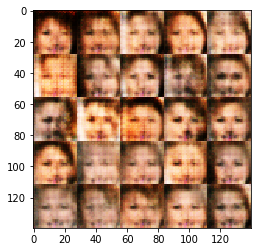

Epoch 1/1... Discriminator Loss: 1.5135... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 1.7016... Generator Loss: 0.4130
Epoch 1/1... Discriminator Loss: 1.6004... Generator Loss: 0.4209
Epoch 1/1... Discriminator Loss: 1.6390... Generator Loss: 0.4229
Epoch 1/1... Discriminator Loss: 1.5395... Generator Loss: 0.4625
Epoch 1/1... Discriminator Loss: 1.7473... Generator Loss: 0.3549
Epoch 1/1... Discriminator Loss: 1.6585... Generator Loss: 0.4029
Epoch 1/1... Discriminator Loss: 1.7285... Generator Loss: 0.3712
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.4836
Epoch 1/1... Discriminator Loss: 1.7224... Generator Loss: 0.3742


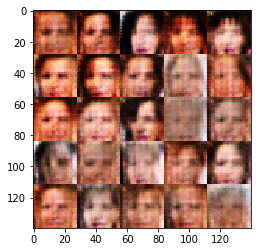

Epoch 1/1... Discriminator Loss: 1.9555... Generator Loss: 0.3014
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.4916
Epoch 1/1... Discriminator Loss: 1.8820... Generator Loss: 0.3348
Epoch 1/1... Discriminator Loss: 1.6513... Generator Loss: 0.3918
Epoch 1/1... Discriminator Loss: 1.8131... Generator Loss: 0.3127
Epoch 1/1... Discriminator Loss: 1.5819... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 1.4984... Generator Loss: 0.5013
Epoch 1/1... Discriminator Loss: 1.6734... Generator Loss: 0.4333
Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.5287
Epoch 1/1... Discriminator Loss: 1.5252... Generator Loss: 0.5024


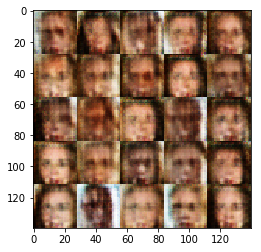

Epoch 1/1... Discriminator Loss: 1.5795... Generator Loss: 0.3931
Epoch 1/1... Discriminator Loss: 1.6006... Generator Loss: 0.4183
Epoch 1/1... Discriminator Loss: 1.6628... Generator Loss: 0.4371
Epoch 1/1... Discriminator Loss: 1.7001... Generator Loss: 0.3490
Epoch 1/1... Discriminator Loss: 1.8243... Generator Loss: 0.3127
Epoch 1/1... Discriminator Loss: 1.5182... Generator Loss: 0.4260
Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.5058
Epoch 1/1... Discriminator Loss: 1.6234... Generator Loss: 0.3995
Epoch 1/1... Discriminator Loss: 1.4964... Generator Loss: 0.4519
Epoch 1/1... Discriminator Loss: 1.8143... Generator Loss: 0.3684


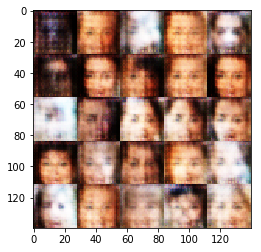

Epoch 1/1... Discriminator Loss: 1.5373... Generator Loss: 0.4688
Epoch 1/1... Discriminator Loss: 1.7104... Generator Loss: 0.3765
Epoch 1/1... Discriminator Loss: 1.6480... Generator Loss: 0.3799
Epoch 1/1... Discriminator Loss: 1.5177... Generator Loss: 0.5126
Epoch 1/1... Discriminator Loss: 1.5167... Generator Loss: 0.4661
Epoch 1/1... Discriminator Loss: 1.5476... Generator Loss: 0.4768
Epoch 1/1... Discriminator Loss: 1.6554... Generator Loss: 0.4388
Epoch 1/1... Discriminator Loss: 1.5928... Generator Loss: 0.4329
Epoch 1/1... Discriminator Loss: 1.6041... Generator Loss: 0.4717
Epoch 1/1... Discriminator Loss: 1.5024... Generator Loss: 0.4383


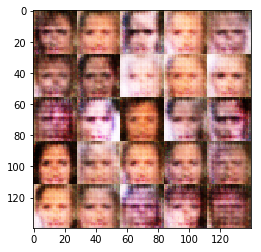

Epoch 1/1... Discriminator Loss: 1.4697... Generator Loss: 0.5371
Epoch 1/1... Discriminator Loss: 1.5098... Generator Loss: 0.4802
Epoch 1/1... Discriminator Loss: 1.5525... Generator Loss: 0.4959
Epoch 1/1... Discriminator Loss: 1.5283... Generator Loss: 0.5200
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.5678
Epoch 1/1... Discriminator Loss: 1.5620... Generator Loss: 0.4250
Epoch 1/1... Discriminator Loss: 1.5173... Generator Loss: 0.4784
Epoch 1/1... Discriminator Loss: 1.4915... Generator Loss: 0.4997
Epoch 1/1... Discriminator Loss: 1.6527... Generator Loss: 0.4148
Epoch 1/1... Discriminator Loss: 1.5253... Generator Loss: 0.4329


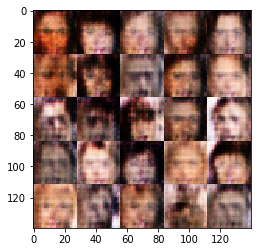

Epoch 1/1... Discriminator Loss: 1.5019... Generator Loss: 0.4910
Epoch 1/1... Discriminator Loss: 1.5993... Generator Loss: 0.4260
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.5642
Epoch 1/1... Discriminator Loss: 1.7390... Generator Loss: 0.4148
Epoch 1/1... Discriminator Loss: 1.5384... Generator Loss: 0.4828
Epoch 1/1... Discriminator Loss: 1.3976... Generator Loss: 0.5387
Epoch 1/1... Discriminator Loss: 1.6034... Generator Loss: 0.4605
Epoch 1/1... Discriminator Loss: 1.5351... Generator Loss: 0.4512
Epoch 1/1... Discriminator Loss: 1.5311... Generator Loss: 0.4995
Epoch 1/1... Discriminator Loss: 1.5898... Generator Loss: 0.4976


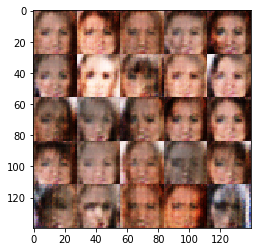

Epoch 1/1... Discriminator Loss: 1.7011... Generator Loss: 0.4465
Epoch 1/1... Discriminator Loss: 1.4550... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 1.5669... Generator Loss: 0.4403
Epoch 1/1... Discriminator Loss: 1.6252... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.6309... Generator Loss: 0.4408
Epoch 1/1... Discriminator Loss: 1.5272... Generator Loss: 0.5604
Epoch 1/1... Discriminator Loss: 1.5488... Generator Loss: 0.4276
Epoch 1/1... Discriminator Loss: 1.8896... Generator Loss: 0.3324
Epoch 1/1... Discriminator Loss: 1.6518... Generator Loss: 0.4227
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.5735


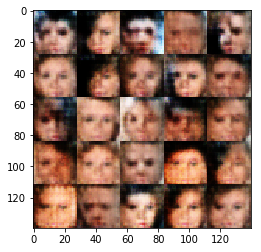

Epoch 1/1... Discriminator Loss: 1.7252... Generator Loss: 0.4084
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.5877
Epoch 1/1... Discriminator Loss: 1.4359... Generator Loss: 0.5099
Epoch 1/1... Discriminator Loss: 1.5678... Generator Loss: 0.4561
Epoch 1/1... Discriminator Loss: 1.7485... Generator Loss: 0.3729
Epoch 1/1... Discriminator Loss: 1.8080... Generator Loss: 0.3564
Epoch 1/1... Discriminator Loss: 1.5173... Generator Loss: 0.4275
Epoch 1/1... Discriminator Loss: 1.6584... Generator Loss: 0.4603
Epoch 1/1... Discriminator Loss: 1.5806... Generator Loss: 0.3949
Epoch 1/1... Discriminator Loss: 1.5472... Generator Loss: 0.4783


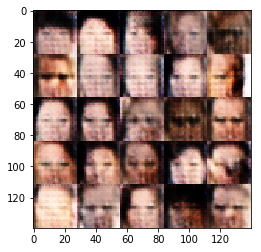

Epoch 1/1... Discriminator Loss: 1.4460... Generator Loss: 0.4800
Epoch 1/1... Discriminator Loss: 1.7554... Generator Loss: 0.3489
Epoch 1/1... Discriminator Loss: 2.0181... Generator Loss: 0.3333
Epoch 1/1... Discriminator Loss: 1.6104... Generator Loss: 0.4405
Epoch 1/1... Discriminator Loss: 1.4517... Generator Loss: 0.5357
Epoch 1/1... Discriminator Loss: 1.4386... Generator Loss: 0.5125
Epoch 1/1... Discriminator Loss: 1.6210... Generator Loss: 0.4898
Epoch 1/1... Discriminator Loss: 1.5758... Generator Loss: 0.3862
Epoch 1/1... Discriminator Loss: 1.6252... Generator Loss: 0.4402
Epoch 1/1... Discriminator Loss: 1.5148... Generator Loss: 0.4752


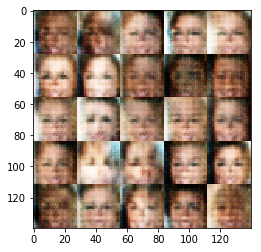

Epoch 1/1... Discriminator Loss: 1.5851... Generator Loss: 0.4285
Epoch 1/1... Discriminator Loss: 1.8626... Generator Loss: 0.2887
Epoch 1/1... Discriminator Loss: 1.5083... Generator Loss: 0.5730
Epoch 1/1... Discriminator Loss: 1.5439... Generator Loss: 0.4684
Epoch 1/1... Discriminator Loss: 1.5118... Generator Loss: 0.5197
Epoch 1/1... Discriminator Loss: 1.5948... Generator Loss: 0.4842
Epoch 1/1... Discriminator Loss: 1.5521... Generator Loss: 0.4947
Epoch 1/1... Discriminator Loss: 1.5905... Generator Loss: 0.4653
Epoch 1/1... Discriminator Loss: 1.6367... Generator Loss: 0.4584
Epoch 1/1... Discriminator Loss: 1.6248... Generator Loss: 0.4475


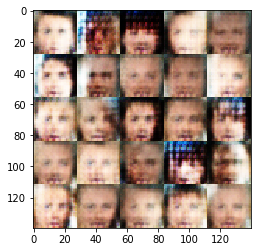

Epoch 1/1... Discriminator Loss: 1.7400... Generator Loss: 0.4125
Epoch 1/1... Discriminator Loss: 1.7308... Generator Loss: 0.3824
Epoch 1/1... Discriminator Loss: 1.5441... Generator Loss: 0.4535
Epoch 1/1... Discriminator Loss: 1.6376... Generator Loss: 0.4003
Epoch 1/1... Discriminator Loss: 1.5325... Generator Loss: 0.4447
Epoch 1/1... Discriminator Loss: 1.4257... Generator Loss: 0.5505
Epoch 1/1... Discriminator Loss: 1.7332... Generator Loss: 0.3713
Epoch 1/1... Discriminator Loss: 1.6861... Generator Loss: 0.3754
Epoch 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 1.4763... Generator Loss: 0.4767


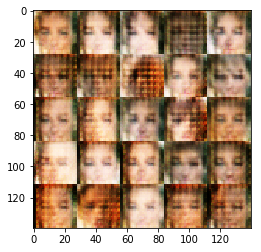

Epoch 1/1... Discriminator Loss: 1.6251... Generator Loss: 0.4493
Epoch 1/1... Discriminator Loss: 1.6250... Generator Loss: 0.4151
Epoch 1/1... Discriminator Loss: 1.5908... Generator Loss: 0.4368
Epoch 1/1... Discriminator Loss: 1.5401... Generator Loss: 0.4629
Epoch 1/1... Discriminator Loss: 1.4316... Generator Loss: 0.4830
Epoch 1/1... Discriminator Loss: 1.5488... Generator Loss: 0.4105
Epoch 1/1... Discriminator Loss: 1.5622... Generator Loss: 0.4551
Epoch 1/1... Discriminator Loss: 1.8255... Generator Loss: 0.4126
Epoch 1/1... Discriminator Loss: 1.6314... Generator Loss: 0.3733
Epoch 1/1... Discriminator Loss: 1.7102... Generator Loss: 0.3440


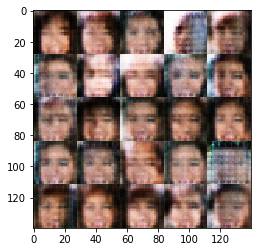

Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.5813
Epoch 1/1... Discriminator Loss: 1.7290... Generator Loss: 0.4015
Epoch 1/1... Discriminator Loss: 1.5673... Generator Loss: 0.4315
Epoch 1/1... Discriminator Loss: 1.6527... Generator Loss: 0.4355
Epoch 1/1... Discriminator Loss: 1.5790... Generator Loss: 0.4219
Epoch 1/1... Discriminator Loss: 1.6583... Generator Loss: 0.4333
Epoch 1/1... Discriminator Loss: 1.7047... Generator Loss: 0.3872
Epoch 1/1... Discriminator Loss: 1.5855... Generator Loss: 0.4298
Epoch 1/1... Discriminator Loss: 1.5591... Generator Loss: 0.4460
Epoch 1/1... Discriminator Loss: 1.7179... Generator Loss: 0.3296


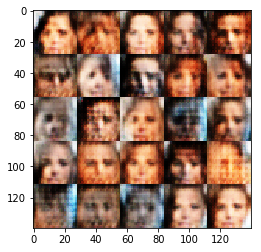

Epoch 1/1... Discriminator Loss: 1.6282... Generator Loss: 0.4366
Epoch 1/1... Discriminator Loss: 1.5625... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 1.8061... Generator Loss: 0.3601
Epoch 1/1... Discriminator Loss: 1.8103... Generator Loss: 0.3877
Epoch 1/1... Discriminator Loss: 1.5067... Generator Loss: 0.4726
Epoch 1/1... Discriminator Loss: 1.5869... Generator Loss: 0.4292
Epoch 1/1... Discriminator Loss: 1.7465... Generator Loss: 0.3784
Epoch 1/1... Discriminator Loss: 1.6298... Generator Loss: 0.4452
Epoch 1/1... Discriminator Loss: 1.5910... Generator Loss: 0.4854
Epoch 1/1... Discriminator Loss: 1.5382... Generator Loss: 0.4233


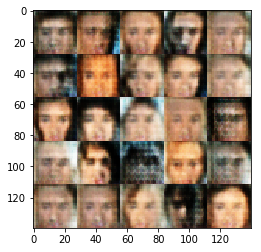

Epoch 1/1... Discriminator Loss: 1.7434... Generator Loss: 0.3830
Epoch 1/1... Discriminator Loss: 1.7029... Generator Loss: 0.3990
Epoch 1/1... Discriminator Loss: 1.6758... Generator Loss: 0.3931
Epoch 1/1... Discriminator Loss: 1.5515... Generator Loss: 0.4204
Epoch 1/1... Discriminator Loss: 1.5414... Generator Loss: 0.4556
Epoch 1/1... Discriminator Loss: 1.5698... Generator Loss: 0.4563
Epoch 1/1... Discriminator Loss: 1.5651... Generator Loss: 0.4570
Epoch 1/1... Discriminator Loss: 1.7125... Generator Loss: 0.4562
Epoch 1/1... Discriminator Loss: 1.5503... Generator Loss: 0.4508
Epoch 1/1... Discriminator Loss: 1.5776... Generator Loss: 0.4643


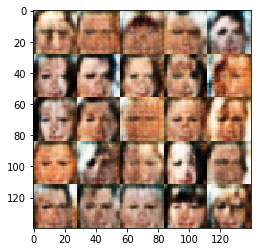

Epoch 1/1... Discriminator Loss: 1.7353... Generator Loss: 0.3703
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.4946
Epoch 1/1... Discriminator Loss: 1.7361... Generator Loss: 0.3887
Epoch 1/1... Discriminator Loss: 1.6044... Generator Loss: 0.4033
Epoch 1/1... Discriminator Loss: 1.6026... Generator Loss: 0.3901
Epoch 1/1... Discriminator Loss: 1.4160... Generator Loss: 0.5435
Epoch 1/1... Discriminator Loss: 1.5659... Generator Loss: 0.4686
Epoch 1/1... Discriminator Loss: 1.6175... Generator Loss: 0.4132
Epoch 1/1... Discriminator Loss: 1.6850... Generator Loss: 0.4177
Epoch 1/1... Discriminator Loss: 1.5166... Generator Loss: 0.4903


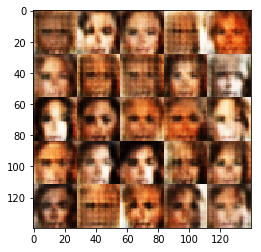

Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.5720
Epoch 1/1... Discriminator Loss: 1.7171... Generator Loss: 0.4194
Epoch 1/1... Discriminator Loss: 1.6574... Generator Loss: 0.3862
Epoch 1/1... Discriminator Loss: 1.5758... Generator Loss: 0.4772
Epoch 1/1... Discriminator Loss: 1.4569... Generator Loss: 0.5562
Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.5713
Epoch 1/1... Discriminator Loss: 1.6155... Generator Loss: 0.5000
Epoch 1/1... Discriminator Loss: 1.6109... Generator Loss: 0.4819
Epoch 1/1... Discriminator Loss: 1.4783... Generator Loss: 0.5478
Epoch 1/1... Discriminator Loss: 1.4763... Generator Loss: 0.5230


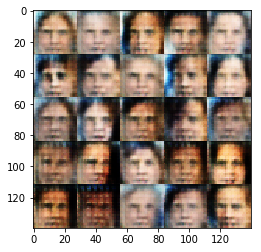

Epoch 1/1... Discriminator Loss: 1.6846... Generator Loss: 0.4309
Epoch 1/1... Discriminator Loss: 1.5994... Generator Loss: 0.4710
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.5410
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.5793
Epoch 1/1... Discriminator Loss: 1.5601... Generator Loss: 0.4856
Epoch 1/1... Discriminator Loss: 1.5780... Generator Loss: 0.4534
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.5351
Epoch 1/1... Discriminator Loss: 1.5926... Generator Loss: 0.4530
Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.5773
Epoch 1/1... Discriminator Loss: 1.5421... Generator Loss: 0.4424


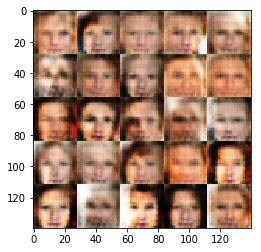

Epoch 1/1... Discriminator Loss: 1.6834... Generator Loss: 0.4724
Epoch 1/1... Discriminator Loss: 1.4324... Generator Loss: 0.5259
Epoch 1/1... Discriminator Loss: 1.6663... Generator Loss: 0.4334
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.5118
Epoch 1/1... Discriminator Loss: 1.5889... Generator Loss: 0.4877
Epoch 1/1... Discriminator Loss: 1.7550... Generator Loss: 0.3755
Epoch 1/1... Discriminator Loss: 1.6460... Generator Loss: 0.4155
Epoch 1/1... Discriminator Loss: 1.4896... Generator Loss: 0.5707
Epoch 1/1... Discriminator Loss: 1.6369... Generator Loss: 0.4161
Epoch 1/1... Discriminator Loss: 1.5681... Generator Loss: 0.4382


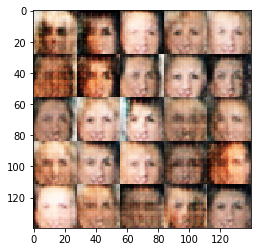

Epoch 1/1... Discriminator Loss: 1.6746... Generator Loss: 0.3493
Epoch 1/1... Discriminator Loss: 1.7387... Generator Loss: 0.3795
Epoch 1/1... Discriminator Loss: 1.4954... Generator Loss: 0.4848
Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.5169
Epoch 1/1... Discriminator Loss: 1.8754... Generator Loss: 0.3835
Epoch 1/1... Discriminator Loss: 1.5700... Generator Loss: 0.4639
Epoch 1/1... Discriminator Loss: 1.5812... Generator Loss: 0.5297
Epoch 1/1... Discriminator Loss: 1.5562... Generator Loss: 0.4898
Epoch 1/1... Discriminator Loss: 1.7432... Generator Loss: 0.4008
Epoch 1/1... Discriminator Loss: 1.4296... Generator Loss: 0.5398


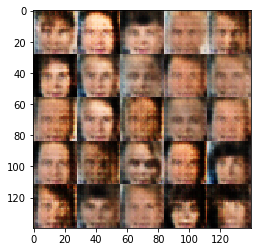

Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.5279... Generator Loss: 0.5333
Epoch 1/1... Discriminator Loss: 1.4127... Generator Loss: 0.5072
Epoch 1/1... Discriminator Loss: 1.5200... Generator Loss: 0.4881
Epoch 1/1... Discriminator Loss: 1.4366... Generator Loss: 0.5502
Epoch 1/1... Discriminator Loss: 1.4337... Generator Loss: 0.4946
Epoch 1/1... Discriminator Loss: 1.6368... Generator Loss: 0.4209
Epoch 1/1... Discriminator Loss: 1.4970... Generator Loss: 0.4692
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.5564
Epoch 1/1... Discriminator Loss: 1.7379... Generator Loss: 0.3362


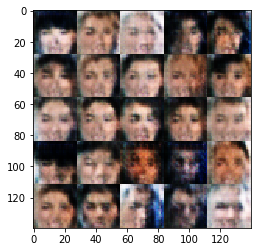

Epoch 1/1... Discriminator Loss: 1.5975... Generator Loss: 0.4372
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.5021
Epoch 1/1... Discriminator Loss: 1.7423... Generator Loss: 0.3709
Epoch 1/1... Discriminator Loss: 1.4999... Generator Loss: 0.5393
Epoch 1/1... Discriminator Loss: 1.5205... Generator Loss: 0.4789
Epoch 1/1... Discriminator Loss: 1.5152... Generator Loss: 0.5100
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.5481
Epoch 1/1... Discriminator Loss: 1.5395... Generator Loss: 0.5134
Epoch 1/1... Discriminator Loss: 1.4994... Generator Loss: 0.5399
Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.5208


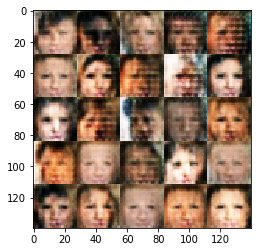

Epoch 1/1... Discriminator Loss: 1.3835... Generator Loss: 0.5272
Epoch 1/1... Discriminator Loss: 1.5004... Generator Loss: 0.5393
Epoch 1/1... Discriminator Loss: 1.4445... Generator Loss: 0.5264
Epoch 1/1... Discriminator Loss: 1.4837... Generator Loss: 0.4483
Epoch 1/1... Discriminator Loss: 1.6635... Generator Loss: 0.4562
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.5493
Epoch 1/1... Discriminator Loss: 1.4840... Generator Loss: 0.4741
Epoch 1/1... Discriminator Loss: 1.5496... Generator Loss: 0.4495
Epoch 1/1... Discriminator Loss: 1.6947... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.5797... Generator Loss: 0.4967


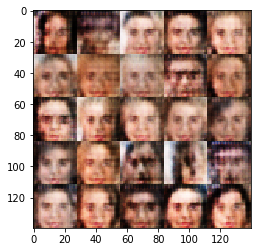

Epoch 1/1... Discriminator Loss: 1.5519... Generator Loss: 0.4723
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.5231
Epoch 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.4738
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.5036
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.4830
Epoch 1/1... Discriminator Loss: 1.6100... Generator Loss: 0.4187
Epoch 1/1... Discriminator Loss: 1.6985... Generator Loss: 0.3572
Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.4369
Epoch 1/1... Discriminator Loss: 1.6245... Generator Loss: 0.4346
Epoch 1/1... Discriminator Loss: 1.6492... Generator Loss: 0.4436


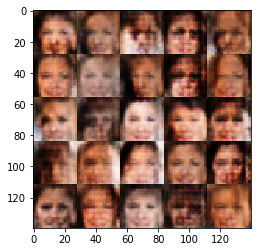

Epoch 1/1... Discriminator Loss: 1.4796... Generator Loss: 0.4555
Epoch 1/1... Discriminator Loss: 1.5269... Generator Loss: 0.4932
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.5230
Epoch 1/1... Discriminator Loss: 1.5461... Generator Loss: 0.5007
Epoch 1/1... Discriminator Loss: 1.7130... Generator Loss: 0.4187
Epoch 1/1... Discriminator Loss: 1.7108... Generator Loss: 0.4234
Epoch 1/1... Discriminator Loss: 1.6516... Generator Loss: 0.4145
Epoch 1/1... Discriminator Loss: 1.4761... Generator Loss: 0.4432
Epoch 1/1... Discriminator Loss: 1.5934... Generator Loss: 0.5154
Epoch 1/1... Discriminator Loss: 1.6331... Generator Loss: 0.4455


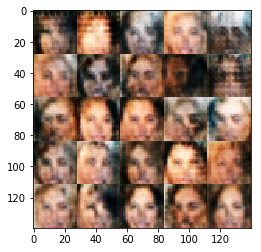

Epoch 1/1... Discriminator Loss: 1.5468... Generator Loss: 0.5178
Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.6255
Epoch 1/1... Discriminator Loss: 1.6592... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 1.5130... Generator Loss: 0.4647
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.5710
Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.5145
Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.4826
Epoch 1/1... Discriminator Loss: 1.6163... Generator Loss: 0.4325
Epoch 1/1... Discriminator Loss: 1.4460... Generator Loss: 0.5063


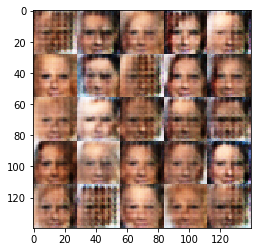

Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.5518
Epoch 1/1... Discriminator Loss: 1.5368... Generator Loss: 0.5250
Epoch 1/1... Discriminator Loss: 1.5611... Generator Loss: 0.4822
Epoch 1/1... Discriminator Loss: 1.5939... Generator Loss: 0.5047
Epoch 1/1... Discriminator Loss: 1.5398... Generator Loss: 0.4679
Epoch 1/1... Discriminator Loss: 1.5615... Generator Loss: 0.5027
Epoch 1/1... Discriminator Loss: 1.5533... Generator Loss: 0.4512
Epoch 1/1... Discriminator Loss: 1.6124... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 1.7053... Generator Loss: 0.3848
Epoch 1/1... Discriminator Loss: 1.5503... Generator Loss: 0.4419


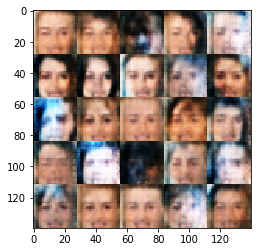

Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.5666
Epoch 1/1... Discriminator Loss: 1.4482... Generator Loss: 0.5211
Epoch 1/1... Discriminator Loss: 1.4490... Generator Loss: 0.5462
Epoch 1/1... Discriminator Loss: 1.4614... Generator Loss: 0.5149
Epoch 1/1... Discriminator Loss: 1.4858... Generator Loss: 0.5301
Epoch 1/1... Discriminator Loss: 1.3932... Generator Loss: 0.5275
Epoch 1/1... Discriminator Loss: 1.4306... Generator Loss: 0.5098
Epoch 1/1... Discriminator Loss: 1.4249... Generator Loss: 0.5676
Epoch 1/1... Discriminator Loss: 1.5275... Generator Loss: 0.5811
Epoch 1/1... Discriminator Loss: 1.6582... Generator Loss: 0.4024


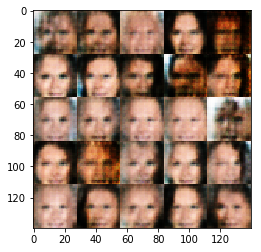

Epoch 1/1... Discriminator Loss: 1.5147... Generator Loss: 0.4636
Epoch 1/1... Discriminator Loss: 1.6075... Generator Loss: 0.3567
Epoch 1/1... Discriminator Loss: 1.7894... Generator Loss: 0.3506
Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.5711
Epoch 1/1... Discriminator Loss: 1.5807... Generator Loss: 0.4211
Epoch 1/1... Discriminator Loss: 1.7015... Generator Loss: 0.4538
Epoch 1/1... Discriminator Loss: 1.5574... Generator Loss: 0.4953
Epoch 1/1... Discriminator Loss: 1.4857... Generator Loss: 0.4985
Epoch 1/1... Discriminator Loss: 1.6742... Generator Loss: 0.4460


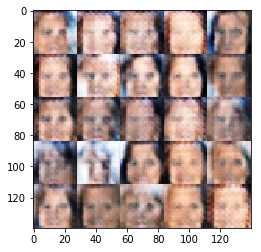

Epoch 1/1... Discriminator Loss: 1.5317... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 1.4969... Generator Loss: 0.5335
Epoch 1/1... Discriminator Loss: 1.5404... Generator Loss: 0.4827
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.5161
Epoch 1/1... Discriminator Loss: 1.5089... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.4709... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.5004... Generator Loss: 0.4880
Epoch 1/1... Discriminator Loss: 1.4385... Generator Loss: 0.5376
Epoch 1/1... Discriminator Loss: 1.5408... Generator Loss: 0.4897
Epoch 1/1... Discriminator Loss: 1.4514... Generator Loss: 0.5500


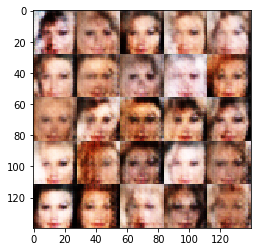

Epoch 1/1... Discriminator Loss: 1.4813... Generator Loss: 0.5113
Epoch 1/1... Discriminator Loss: 1.4849... Generator Loss: 0.6146
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.5281... Generator Loss: 0.5167
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.5875
Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.6109
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 0.5193
Epoch 1/1... Discriminator Loss: 1.5268... Generator Loss: 0.5970
Epoch 1/1... Discriminator Loss: 1.4712... Generator Loss: 0.5474
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.5692


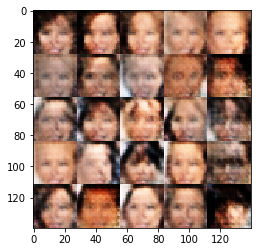

Epoch 1/1... Discriminator Loss: 1.4901... Generator Loss: 0.5602
Epoch 1/1... Discriminator Loss: 1.6659... Generator Loss: 0.4425
Epoch 1/1... Discriminator Loss: 1.4930... Generator Loss: 0.4942
Epoch 1/1... Discriminator Loss: 1.5494... Generator Loss: 0.4798
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.5347
Epoch 1/1... Discriminator Loss: 1.4628... Generator Loss: 0.5000
Epoch 1/1... Discriminator Loss: 1.4926... Generator Loss: 0.5618
Epoch 1/1... Discriminator Loss: 1.5569... Generator Loss: 0.4137
Epoch 1/1... Discriminator Loss: 1.5573... Generator Loss: 0.3902
Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.5503


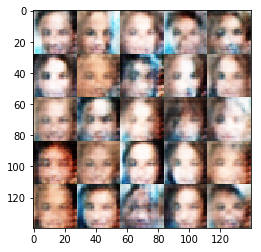

Epoch 1/1... Discriminator Loss: 1.3985... Generator Loss: 0.5754
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.5929
Epoch 1/1... Discriminator Loss: 1.4444... Generator Loss: 0.5532
Epoch 1/1... Discriminator Loss: 1.4482... Generator Loss: 0.5969
Epoch 1/1... Discriminator Loss: 1.6669... Generator Loss: 0.3977
Epoch 1/1... Discriminator Loss: 1.5157... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.6200... Generator Loss: 0.4841
Epoch 1/1... Discriminator Loss: 1.4762... Generator Loss: 0.5244
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.5337
Epoch 1/1... Discriminator Loss: 1.5025... Generator Loss: 0.4714


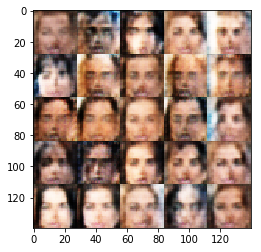

Epoch 1/1... Discriminator Loss: 1.5317... Generator Loss: 0.4975
Epoch 1/1... Discriminator Loss: 1.5802... Generator Loss: 0.4881
Epoch 1/1... Discriminator Loss: 1.4934... Generator Loss: 0.4889
Epoch 1/1... Discriminator Loss: 1.4943... Generator Loss: 0.4998
Epoch 1/1... Discriminator Loss: 1.5721... Generator Loss: 0.4452
Epoch 1/1... Discriminator Loss: 1.6368... Generator Loss: 0.4349
Epoch 1/1... Discriminator Loss: 1.6805... Generator Loss: 0.3900
Epoch 1/1... Discriminator Loss: 1.5421... Generator Loss: 0.4330
Epoch 1/1... Discriminator Loss: 1.7426... Generator Loss: 0.4262
Epoch 1/1... Discriminator Loss: 1.5333... Generator Loss: 0.5096


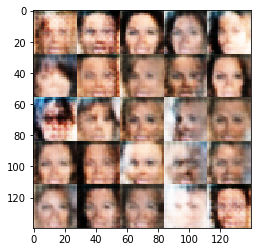

Epoch 1/1... Discriminator Loss: 1.4720... Generator Loss: 0.5562
Epoch 1/1... Discriminator Loss: 1.5702... Generator Loss: 0.4992
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.5384
Epoch 1/1... Discriminator Loss: 1.5586... Generator Loss: 0.5273
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.5163
Epoch 1/1... Discriminator Loss: 1.5407... Generator Loss: 0.4380
Epoch 1/1... Discriminator Loss: 1.5359... Generator Loss: 0.5475
Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.5353
Epoch 1/1... Discriminator Loss: 1.5102... Generator Loss: 0.4797
Epoch 1/1... Discriminator Loss: 1.4801... Generator Loss: 0.4836


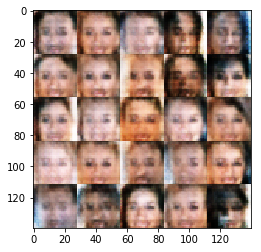

Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.5849
Epoch 1/1... Discriminator Loss: 1.4993... Generator Loss: 0.4595
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.6001
Epoch 1/1... Discriminator Loss: 1.3423... Generator Loss: 0.5795
Epoch 1/1... Discriminator Loss: 1.5311... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.4283... Generator Loss: 0.5420
Epoch 1/1... Discriminator Loss: 1.5910... Generator Loss: 0.4599
Epoch 1/1... Discriminator Loss: 1.4794... Generator Loss: 0.4781
Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.4801


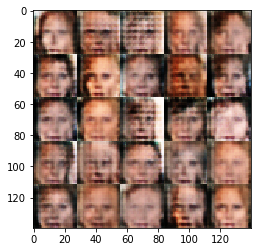

Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.5181
Epoch 1/1... Discriminator Loss: 1.5842... Generator Loss: 0.5063
Epoch 1/1... Discriminator Loss: 1.4416... Generator Loss: 0.5212
Epoch 1/1... Discriminator Loss: 1.4919... Generator Loss: 0.5042
Epoch 1/1... Discriminator Loss: 1.5845... Generator Loss: 0.4146
Epoch 1/1... Discriminator Loss: 1.4838... Generator Loss: 0.5107
Epoch 1/1... Discriminator Loss: 1.5791... Generator Loss: 0.5087
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.5986
Epoch 1/1... Discriminator Loss: 1.3227... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.4982... Generator Loss: 0.5286


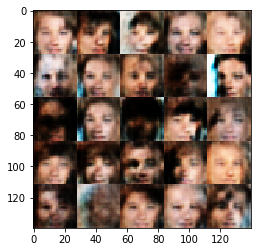

Epoch 1/1... Discriminator Loss: 1.7072... Generator Loss: 0.4646
Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.4595
Epoch 1/1... Discriminator Loss: 1.6380... Generator Loss: 0.4165
Epoch 1/1... Discriminator Loss: 1.6002... Generator Loss: 0.4770
Epoch 1/1... Discriminator Loss: 1.4550... Generator Loss: 0.5372
Epoch 1/1... Discriminator Loss: 1.6471... Generator Loss: 0.4279
Epoch 1/1... Discriminator Loss: 1.4947... Generator Loss: 0.5336
Epoch 1/1... Discriminator Loss: 1.4959... Generator Loss: 0.5000
Epoch 1/1... Discriminator Loss: 1.5265... Generator Loss: 0.5055
Epoch 1/1... Discriminator Loss: 1.5089... Generator Loss: 0.5227


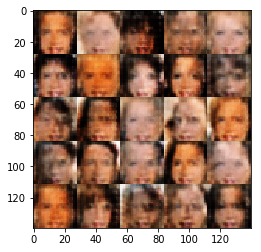

Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.5870
Epoch 1/1... Discriminator Loss: 1.5980... Generator Loss: 0.4721
Epoch 1/1... Discriminator Loss: 1.5023... Generator Loss: 0.5396
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.5573
Epoch 1/1... Discriminator Loss: 1.5151... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.7318... Generator Loss: 0.4164
Epoch 1/1... Discriminator Loss: 1.5799... Generator Loss: 0.5384
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.5407
Epoch 1/1... Discriminator Loss: 1.6334... Generator Loss: 0.4489
Epoch 1/1... Discriminator Loss: 1.4496... Generator Loss: 0.5234


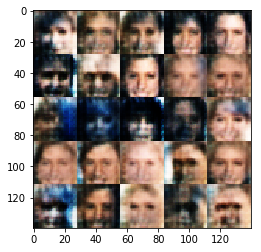

Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.5014
Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.6226
Epoch 1/1... Discriminator Loss: 1.5304... Generator Loss: 0.4793
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.5536
Epoch 1/1... Discriminator Loss: 1.4525... Generator Loss: 0.5080
Epoch 1/1... Discriminator Loss: 1.3064... Generator Loss: 0.5979
Epoch 1/1... Discriminator Loss: 1.7154... Generator Loss: 0.4186
Epoch 1/1... Discriminator Loss: 1.5551... Generator Loss: 0.5552
Epoch 1/1... Discriminator Loss: 1.4605... Generator Loss: 0.5563
Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.6714


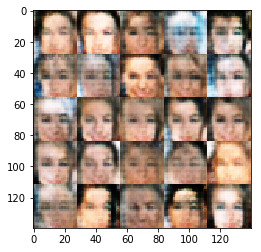

Epoch 1/1... Discriminator Loss: 1.5517... Generator Loss: 0.5554
Epoch 1/1... Discriminator Loss: 1.5388... Generator Loss: 0.5044
Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.5326
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.5557
Epoch 1/1... Discriminator Loss: 1.4878... Generator Loss: 0.4625
Epoch 1/1... Discriminator Loss: 1.4499... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.4290... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 1.5147... Generator Loss: 0.4887
Epoch 1/1... Discriminator Loss: 1.5464... Generator Loss: 0.4912
Epoch 1/1... Discriminator Loss: 1.6210... Generator Loss: 0.4314


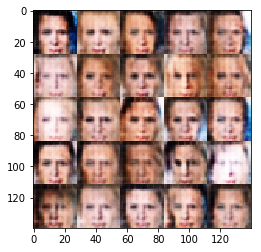

Epoch 1/1... Discriminator Loss: 1.6029... Generator Loss: 0.4925
Epoch 1/1... Discriminator Loss: 1.4994... Generator Loss: 0.4330
Epoch 1/1... Discriminator Loss: 1.5392... Generator Loss: 0.4792
Epoch 1/1... Discriminator Loss: 1.5821... Generator Loss: 0.5040
Epoch 1/1... Discriminator Loss: 1.4355... Generator Loss: 0.5367
Epoch 1/1... Discriminator Loss: 1.7507... Generator Loss: 0.4312
Epoch 1/1... Discriminator Loss: 1.5048... Generator Loss: 0.5502
Epoch 1/1... Discriminator Loss: 1.6156... Generator Loss: 0.5173
Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.5531
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.5821


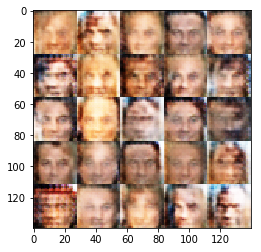

Epoch 1/1... Discriminator Loss: 1.5245... Generator Loss: 0.5345
Epoch 1/1... Discriminator Loss: 1.5147... Generator Loss: 0.4700
Epoch 1/1... Discriminator Loss: 1.5474... Generator Loss: 0.4690
Epoch 1/1... Discriminator Loss: 1.5474... Generator Loss: 0.4467
Epoch 1/1... Discriminator Loss: 1.6765... Generator Loss: 0.4416
Epoch 1/1... Discriminator Loss: 1.4761... Generator Loss: 0.5401
Epoch 1/1... Discriminator Loss: 1.4203... Generator Loss: 0.5044
Epoch 1/1... Discriminator Loss: 1.6376... Generator Loss: 0.3924
Epoch 1/1... Discriminator Loss: 1.4469... Generator Loss: 0.5553
Epoch 1/1... Discriminator Loss: 1.4515... Generator Loss: 0.5769


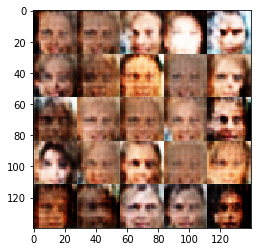

Epoch 1/1... Discriminator Loss: 1.5189... Generator Loss: 0.4964
Epoch 1/1... Discriminator Loss: 1.4996... Generator Loss: 0.5225
Epoch 1/1... Discriminator Loss: 1.4160... Generator Loss: 0.5840
Epoch 1/1... Discriminator Loss: 1.5883... Generator Loss: 0.5087
Epoch 1/1... Discriminator Loss: 1.5184... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.6333
Epoch 1/1... Discriminator Loss: 1.4007... Generator Loss: 0.5815
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.4807
Epoch 1/1... Discriminator Loss: 1.4864... Generator Loss: 0.5500
Epoch 1/1... Discriminator Loss: 1.5131... Generator Loss: 0.6012


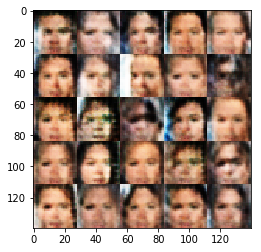

Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.5693
Epoch 1/1... Discriminator Loss: 1.6408... Generator Loss: 0.5181
Epoch 1/1... Discriminator Loss: 1.4482... Generator Loss: 0.5880
Epoch 1/1... Discriminator Loss: 1.4719... Generator Loss: 0.5749
Epoch 1/1... Discriminator Loss: 1.4834... Generator Loss: 0.5528
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.5450
Epoch 1/1... Discriminator Loss: 1.4769... Generator Loss: 0.5201
Epoch 1/1... Discriminator Loss: 1.5491... Generator Loss: 0.5085
Epoch 1/1... Discriminator Loss: 1.4845... Generator Loss: 0.4800
Epoch 1/1... Discriminator Loss: 1.5542... Generator Loss: 0.4762


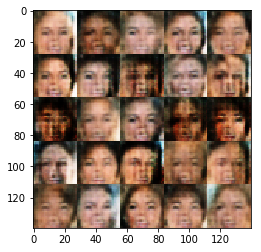

Epoch 1/1... Discriminator Loss: 1.6081... Generator Loss: 0.4787
Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.5872
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.6290
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.6078
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 1.4632... Generator Loss: 0.4856
Epoch 1/1... Discriminator Loss: 1.5511... Generator Loss: 0.4432
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.4908
Epoch 1/1... Discriminator Loss: 1.5891... Generator Loss: 0.5054
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.5583


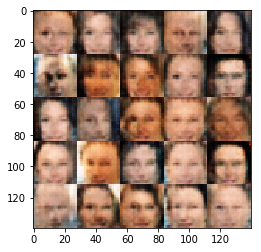

Epoch 1/1... Discriminator Loss: 1.4961... Generator Loss: 0.5569
Epoch 1/1... Discriminator Loss: 1.5545... Generator Loss: 0.5123
Epoch 1/1... Discriminator Loss: 1.5032... Generator Loss: 0.5316
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.6312
Epoch 1/1... Discriminator Loss: 1.4579... Generator Loss: 0.5602
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.5225
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.5351
Epoch 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.6036
Epoch 1/1... Discriminator Loss: 1.4753... Generator Loss: 0.5587


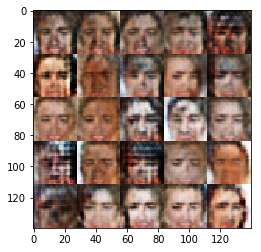

Epoch 1/1... Discriminator Loss: 1.5454... Generator Loss: 0.4174
Epoch 1/1... Discriminator Loss: 1.4462... Generator Loss: 0.5424
Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.5789
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.5467
Epoch 1/1... Discriminator Loss: 1.4472... Generator Loss: 0.5621
Epoch 1/1... Discriminator Loss: 1.4736... Generator Loss: 0.5456
Epoch 1/1... Discriminator Loss: 1.4858... Generator Loss: 0.5213
Epoch 1/1... Discriminator Loss: 1.4391... Generator Loss: 0.5961
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.5407
Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.5898


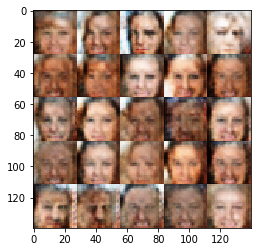

Epoch 1/1... Discriminator Loss: 1.4778... Generator Loss: 0.5135
Epoch 1/1... Discriminator Loss: 1.5042... Generator Loss: 0.4458
Epoch 1/1... Discriminator Loss: 1.4855... Generator Loss: 0.5134
Epoch 1/1... Discriminator Loss: 1.4266... Generator Loss: 0.5441
Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.4927
Epoch 1/1... Discriminator Loss: 1.6221... Generator Loss: 0.4775
Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.5142
Epoch 1/1... Discriminator Loss: 1.5199... Generator Loss: 0.4704
Epoch 1/1... Discriminator Loss: 1.4861... Generator Loss: 0.4428
Epoch 1/1... Discriminator Loss: 1.4765... Generator Loss: 0.4852


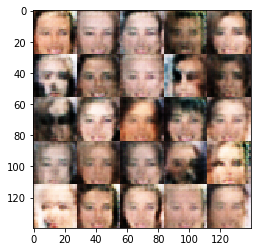

Epoch 1/1... Discriminator Loss: 1.4830... Generator Loss: 0.5330
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.5230
Epoch 1/1... Discriminator Loss: 1.6384... Generator Loss: 0.4344
Epoch 1/1... Discriminator Loss: 1.5141... Generator Loss: 0.5155
Epoch 1/1... Discriminator Loss: 1.7302... Generator Loss: 0.4711
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.5035
Epoch 1/1... Discriminator Loss: 1.5417... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.5552


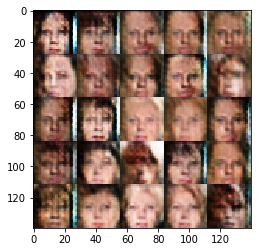

Epoch 1/1... Discriminator Loss: 1.4466... Generator Loss: 0.5746
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.5309
Epoch 1/1... Discriminator Loss: 1.4622... Generator Loss: 0.5404
Epoch 1/1... Discriminator Loss: 1.4934... Generator Loss: 0.6100
Epoch 1/1... Discriminator Loss: 1.4014... Generator Loss: 0.5539
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.5677
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.5530
Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.5418
Epoch 1/1... Discriminator Loss: 1.4447... Generator Loss: 0.5062
Epoch 1/1... Discriminator Loss: 1.5927... Generator Loss: 0.4487


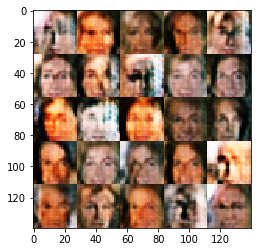

Epoch 1/1... Discriminator Loss: 1.5493... Generator Loss: 0.5038
Epoch 1/1... Discriminator Loss: 1.4761... Generator Loss: 0.5949
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.6247
Epoch 1/1... Discriminator Loss: 1.5349... Generator Loss: 0.6455
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.5802
Epoch 1/1... Discriminator Loss: 1.5433... Generator Loss: 0.4678
Epoch 1/1... Discriminator Loss: 1.4416... Generator Loss: 0.5219
Epoch 1/1... Discriminator Loss: 1.5092... Generator Loss: 0.4995
Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.6015
Epoch 1/1... Discriminator Loss: 1.4126... Generator Loss: 0.5793


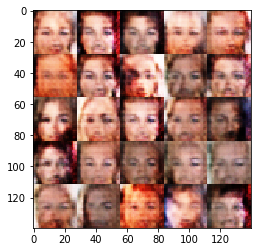

Epoch 1/1... Discriminator Loss: 1.4829... Generator Loss: 0.5373
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.5327
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.5500
Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.5520
Epoch 1/1... Discriminator Loss: 1.4347... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.5625
Epoch 1/1... Discriminator Loss: 1.4083... Generator Loss: 0.5864
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 1.4675... Generator Loss: 0.5556
Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.6465


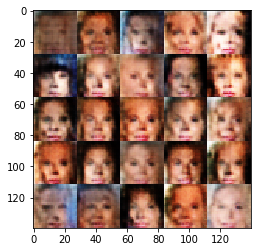

Epoch 1/1... Discriminator Loss: 1.3412... Generator Loss: 0.5757
Epoch 1/1... Discriminator Loss: 1.5391... Generator Loss: 0.5455
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 0.5291
Epoch 1/1... Discriminator Loss: 1.4401... Generator Loss: 0.5910
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.5296
Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.6022
Epoch 1/1... Discriminator Loss: 1.5055... Generator Loss: 0.5083
Epoch 1/1... Discriminator Loss: 1.4935... Generator Loss: 0.4846
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.6536


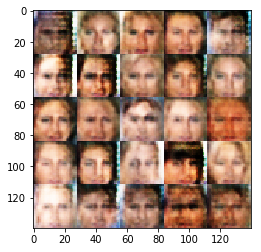

Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.5265
Epoch 1/1... Discriminator Loss: 1.5532... Generator Loss: 0.5161
Epoch 1/1... Discriminator Loss: 1.5793... Generator Loss: 0.4897
Epoch 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.5071
Epoch 1/1... Discriminator Loss: 1.5341... Generator Loss: 0.5651
Epoch 1/1... Discriminator Loss: 1.4868... Generator Loss: 0.5984
Epoch 1/1... Discriminator Loss: 1.4739... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.4967... Generator Loss: 0.4644
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.6268
Epoch 1/1... Discriminator Loss: 1.3507... Generator Loss: 0.6576


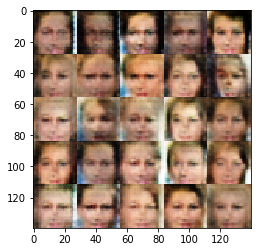

Epoch 1/1... Discriminator Loss: 1.4638... Generator Loss: 0.5856
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.5107
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.5545
Epoch 1/1... Discriminator Loss: 1.5211... Generator Loss: 0.5166
Epoch 1/1... Discriminator Loss: 1.5168... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.3401... Generator Loss: 0.5754
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.5716
Epoch 1/1... Discriminator Loss: 1.4743... Generator Loss: 0.5243
Epoch 1/1... Discriminator Loss: 1.4570... Generator Loss: 0.5226


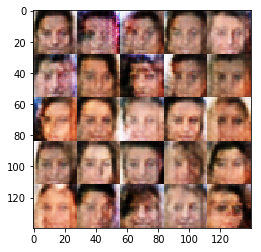

Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.5820
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.5582
Epoch 1/1... Discriminator Loss: 1.4856... Generator Loss: 0.5114
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.4820
Epoch 1/1... Discriminator Loss: 1.4940... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.5365
Epoch 1/1... Discriminator Loss: 1.5697... Generator Loss: 0.4768
Epoch 1/1... Discriminator Loss: 1.4675... Generator Loss: 0.5851
Epoch 1/1... Discriminator Loss: 1.5220... Generator Loss: 0.5622
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.5495


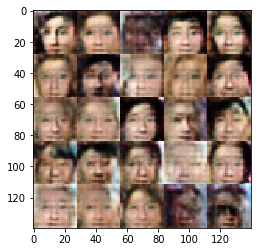

Epoch 1/1... Discriminator Loss: 1.6026... Generator Loss: 0.4362
Epoch 1/1... Discriminator Loss: 1.5027... Generator Loss: 0.5170
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.5821
Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.4980
Epoch 1/1... Discriminator Loss: 1.4520... Generator Loss: 0.5362
Epoch 1/1... Discriminator Loss: 1.4789... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.5735... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.3494... Generator Loss: 0.5884
Epoch 1/1... Discriminator Loss: 1.5491... Generator Loss: 0.4664
Epoch 1/1... Discriminator Loss: 1.4944... Generator Loss: 0.5639


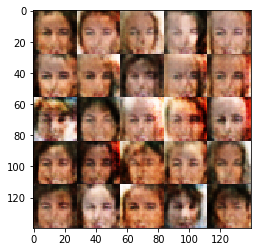

Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.5407
Epoch 1/1... Discriminator Loss: 1.3423... Generator Loss: 0.5940
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 1.5157... Generator Loss: 0.5488
Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 0.5978
Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.5656
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.5811
Epoch 1/1... Discriminator Loss: 1.4683... Generator Loss: 0.5505
Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 0.5590


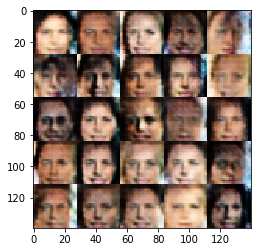

Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.5692
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 0.6471
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.5955
Epoch 1/1... Discriminator Loss: 1.2520... Generator Loss: 0.6963
Epoch 1/1... Discriminator Loss: 1.4211... Generator Loss: 0.5894
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.4654... Generator Loss: 0.5560
Epoch 1/1... Discriminator Loss: 1.4381... Generator Loss: 0.5556
Epoch 1/1... Discriminator Loss: 1.5021... Generator Loss: 0.5350
Epoch 1/1... Discriminator Loss: 1.3777... Generator Loss: 0.5578


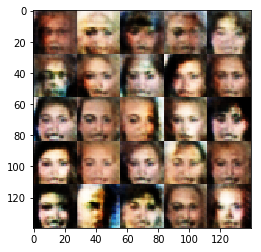

Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.5281
Epoch 1/1... Discriminator Loss: 1.5583... Generator Loss: 0.4887
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.5168
Epoch 1/1... Discriminator Loss: 1.5222... Generator Loss: 0.4793
Epoch 1/1... Discriminator Loss: 1.5451... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.5660
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.5717
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.5316
Epoch 1/1... Discriminator Loss: 1.5350... Generator Loss: 0.5431


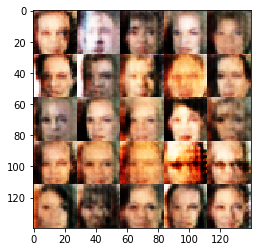

Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.6581
Epoch 1/1... Discriminator Loss: 1.6172... Generator Loss: 0.4651
Epoch 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.5833
Epoch 1/1... Discriminator Loss: 1.3910... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.3695... Generator Loss: 0.5791
Epoch 1/1... Discriminator Loss: 1.5720... Generator Loss: 0.4774
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.5217
Epoch 1/1... Discriminator Loss: 1.4073... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.5291... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.4923... Generator Loss: 0.5605


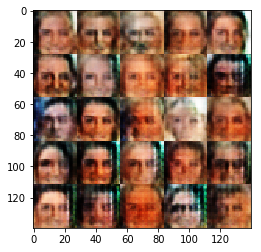

Epoch 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.5268
Epoch 1/1... Discriminator Loss: 1.4553... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.5532
Epoch 1/1... Discriminator Loss: 1.4991... Generator Loss: 0.5496
Epoch 1/1... Discriminator Loss: 1.5140... Generator Loss: 0.5110
Epoch 1/1... Discriminator Loss: 1.5455... Generator Loss: 0.4502
Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.5508
Epoch 1/1... Discriminator Loss: 1.4870... Generator Loss: 0.5386
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.5074
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.5832


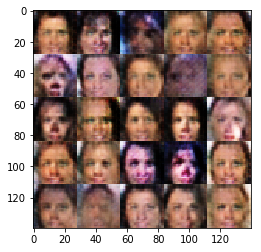

Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.6235
Epoch 1/1... Discriminator Loss: 1.3746... Generator Loss: 0.5289
Epoch 1/1... Discriminator Loss: 1.6691... Generator Loss: 0.5203
Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.5469
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.4643
Epoch 1/1... Discriminator Loss: 1.5718... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 1.4813... Generator Loss: 0.5061
Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 0.4680
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.5353


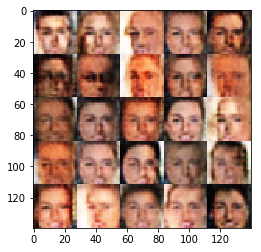

Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.5194
Epoch 1/1... Discriminator Loss: 1.4487... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.4651... Generator Loss: 0.5167
Epoch 1/1... Discriminator Loss: 1.4206... Generator Loss: 0.5694
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 0.5531
Epoch 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.5910
Epoch 1/1... Discriminator Loss: 1.5120... Generator Loss: 0.5313
Epoch 1/1... Discriminator Loss: 1.4710... Generator Loss: 0.5260
Epoch 1/1... Discriminator Loss: 1.4423... Generator Loss: 0.4833


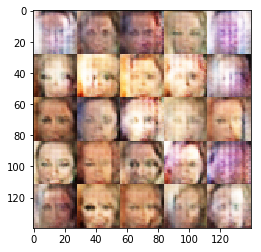

Epoch 1/1... Discriminator Loss: 1.3473... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.5411
Epoch 1/1... Discriminator Loss: 1.5263... Generator Loss: 0.5238
Epoch 1/1... Discriminator Loss: 1.5784... Generator Loss: 0.4649
Epoch 1/1... Discriminator Loss: 1.5784... Generator Loss: 0.4745
Epoch 1/1... Discriminator Loss: 1.4963... Generator Loss: 0.5754
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.5207
Epoch 1/1... Discriminator Loss: 1.5305... Generator Loss: 0.4634
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.5799
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.5849


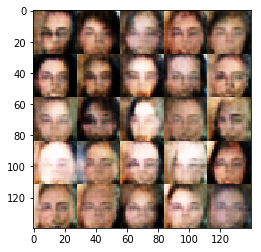

Epoch 1/1... Discriminator Loss: 1.5940... Generator Loss: 0.5003
Epoch 1/1... Discriminator Loss: 1.5082... Generator Loss: 0.5302
Epoch 1/1... Discriminator Loss: 1.4676... Generator Loss: 0.5714
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.5353
Epoch 1/1... Discriminator Loss: 1.4597... Generator Loss: 0.5679
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.6184
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.5548
Epoch 1/1... Discriminator Loss: 1.6170... Generator Loss: 0.5111
Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.6086


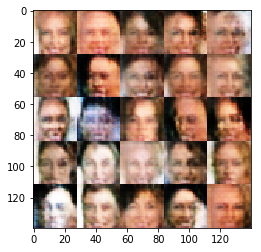

Epoch 1/1... Discriminator Loss: 1.5113... Generator Loss: 0.4506
Epoch 1/1... Discriminator Loss: 1.5030... Generator Loss: 0.5077


In [ ]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.